In [1]:
# Evaluation Projects
# Name : Sayyed Mudassar Iqbal Shakil Ahmed
# Batch : DSG2404
# Subject : Insurance Claim Fraud Detection Project 3 Solution

## Importing Libraries

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

## Loading Our Dataset

In [4]:
df = pd.read_csv("Automobile_insurance_fraud.csv")
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


- Feels like column "_c39" is irrelevant one with missing values and context, hence will drop it later.
- Also as we have to predict the claim is Fraud or not, hence its a <b> "Classification" </b> analysis. 

## EDA (Exploratory Data Analysis)

In [5]:
df.shape

(1000, 40)

#### We will be working with 1000 rows and 40 columns

In [6]:
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

We can see authorities contacted have 91 null values, hence filling those with mode.

In [9]:
pd.set_option('display.max_columns', None)

In [10]:
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,NaN,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,22-02-2015,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,6045 Andromedia St,20,1,YES,0,1,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,24-01-2015,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,3092 Texas Drive,23,1,YES,2,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,23-01-2015,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,7629 5th St,4,3,?,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,26-02-2015,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,6128 Elm Lane,2,1,?,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [11]:
# Calculating the mode of the 'authorities_contacted' column
mode_value = df['authorities_contacted'].mode()[0]

# Fill the NaN values with the mode
df['authorities_contacted'].fillna(mode_value, inplace=True)

# Checking the DataFrame for null values to see the changes
print(df.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

#### Observations:  
1. There are 2 columns with float data type, 17 with int64 data type, and 21 columns with object data type.  
2. Now, There are no null values except for the '_c39' column, where no values are known.  
3. Some entries in the dataset contain "?" or may have trailing white spaces, which need to be checked and appropriately filled or cleaned.

In [13]:
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In [14]:
# dropping empty column 
df.drop(columns=['_c39'], inplace=True)

#### I observed some question marks, so lets check how many question marks (" ?") inside dataset.

In [15]:
df.isin(['?']).sum()

months_as_customer               0
age                              0
policy_number                    0
policy_bind_date                 0
policy_state                     0
policy_csl                       0
policy_deductable                0
policy_annual_premium            0
umbrella_limit                   0
insured_zip                      0
insured_sex                      0
insured_education_level          0
insured_occupation               0
insured_hobbies                  0
insured_relationship             0
capital-gains                    0
capital-loss                     0
incident_date                    0
incident_type                    0
collision_type                 178
incident_severity                0
authorities_contacted            0
incident_state                   0
incident_city                    0
incident_location                0
incident_hour_of_the_day         0
number_of_vehicles_involved      0
property_damage                360
bodily_injuries     

#### It is evident that the columns 'collision_type', 'property_damage', and 'police_report_available' contain some rows with "?" as a value. These will need to be addressed and treated accordingly.

In [17]:
# Lets replace ' ?' with np.NaN
df=df.replace('?',np.NaN)

In [18]:
# Lets check if any whitespace, 'NA' or '-' exist in dataset.
df.isin([' ','NA','-']).sum().any()

False

#### We will drop the following columns: 'Policy Number', 'Incident_Location', 'insured_zip', 'policy_bind_date', 'incident_date', 'incident_hour_of_the_day', and 'auto_year', as these columns contain unique values that do not contribute any significance to the analysis.

In [19]:
df.drop(columns=['policy_number', 'incident_location', 'insured_zip','policy_bind_date', 'incident_date', 'incident_hour_of_the_day','auto_year'], inplace=True)

In [20]:
# Now lets also fill the Null values in columns 'collision_type', 'property_damage', 'police_report_available' using mode.
df['collision_type'] = df['collision_type'].fillna(df['collision_type'].mode()[0])
df['property_damage'] = df['property_damage'].fillna(df['property_damage'].mode()[0])
df['police_report_available'] = df['police_report_available'].fillna(df['police_report_available'].mode()[0])

#### Finally checking null values again

In [21]:
df.isnull().sum()

months_as_customer             0
age                            0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_claim                   0
property_claim                 0
vehicle_claim                  0
auto_make                      0
auto_model

All the null values have been filled, hence we can proceed further

#### Segregating Numerical and Categorical Columns 

In [22]:
#checking for categorical columns
categorical_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]=="object":
        categorical_col.append(i)
print("Categorical Columns:",categorical_col)

#checking numerical Columns
numerical_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]!="object":
        numerical_col.append(i)
print("Numerical Columns:",numerical_col)

Categorical Columns: ['policy_state', 'policy_csl', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']
Numerical Columns: ['months_as_customer', 'age', 'policy_deductable', 'policy_annual_premium', 'umbrella_limit', 'capital-gains', 'capital-loss', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim']


## Data Visualisation

### Univariate Analysis

In [23]:
#Finding counts of Fraud Detection 
df['fraud_reported'].value_counts() # Count number of frauds vs non-frauds

fraud_reported
N    753
Y    247
Name: count, dtype: int64

We will have to balance data later as we have less samples for Frauds.

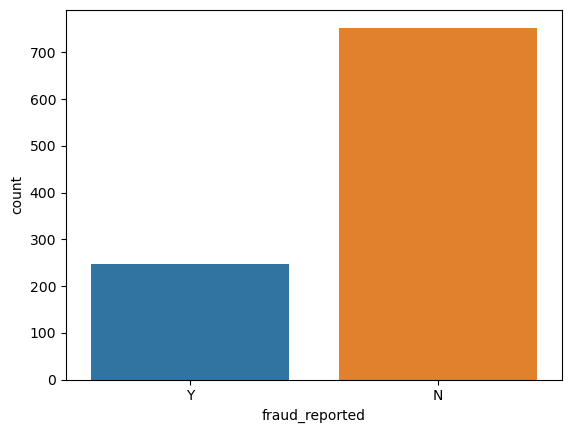

fraud_reported
N    75.3
Y    24.7
Name: proportion, dtype: float64


In [24]:
# Plot distribution of fraud_reported
sns.countplot(x='fraud_reported', data=df)
plt.show()
# Calculate the percentage of each category in the fraud_reported column
fraud_reported_counts = df['fraud_reported'].value_counts(normalize=True) * 100
# Display the percentages
print(fraud_reported_counts)

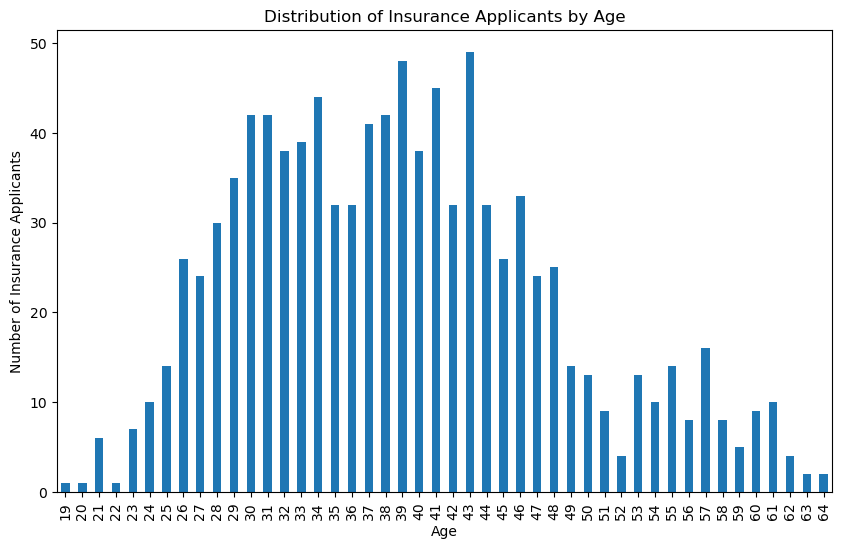

In [25]:
# Group by age and count the number of occurrences
age_counts = df['age'].value_counts().sort_index()

# Plot the distribution of ages
plt.figure(figsize=(10, 6))
age_counts.plot(kind='bar')
plt.xlabel('Age')
plt.ylabel('Number of Insurance Applicants')
plt.title('Distribution of Insurance Applicants by Age')
plt.show()

- The most frequent applicants for insurance are 43 years old, followed by those aged 39, 41, and 34 years.

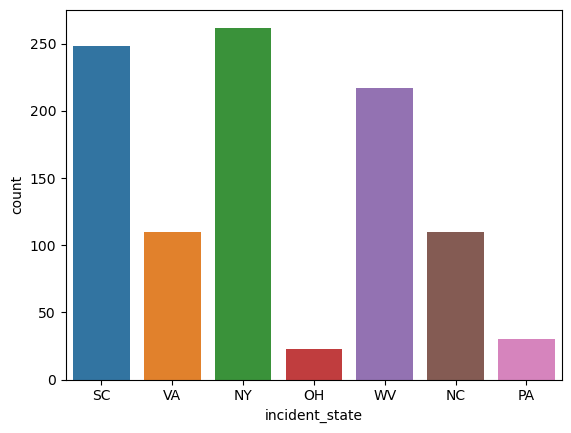

In [26]:
# Plot distribution of incident_state
df['incident_state'].value_counts()
sns.countplot(x='incident_state', data=df)
plt.show()

- Most of the cases reported are from NY followed by SC. also state OH has less reported number of incidents, which is a good thing

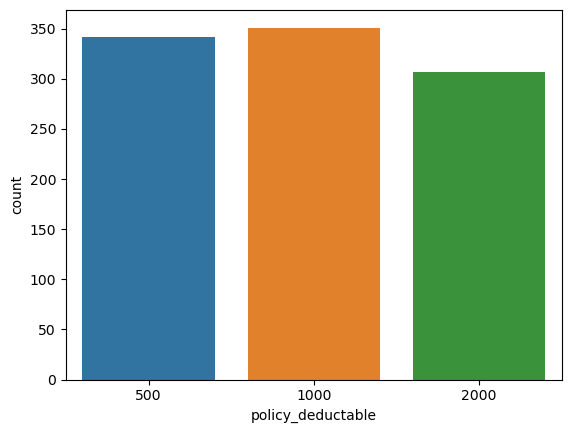

In [28]:
# Plot distribution of policy_deductable
df['policy_deductable'].value_counts()
sns.countplot(x='policy_deductable', data=df)
plt.show()

- The highest amount of money that a customer is responsible for paying toward an insured loss is 1000.

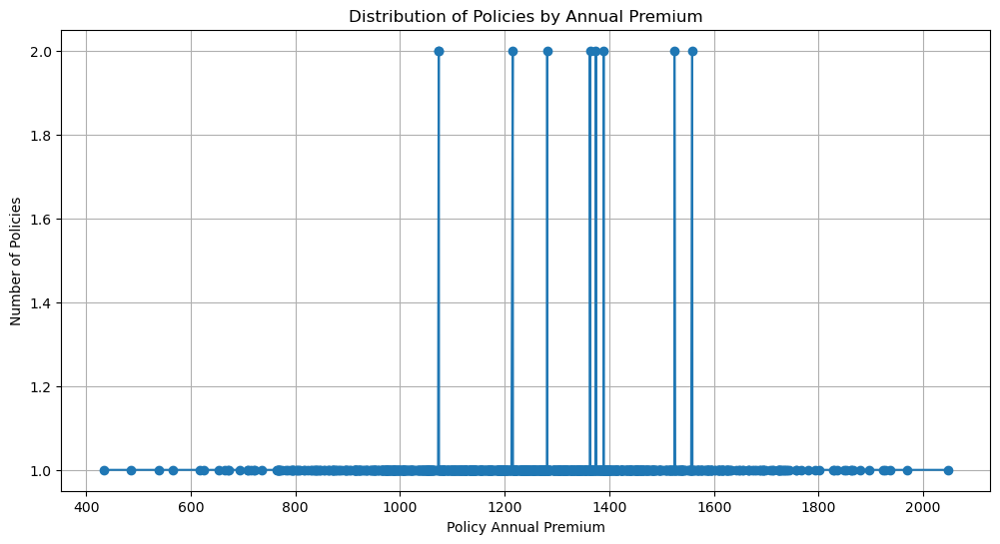

In [29]:
# Group by policy_annual_premium and count the number of occurrences
policy_annual_premium_counts = df['policy_annual_premium'].value_counts().sort_index()

# Plot the distribution of policy_annual_premium
plt.figure(figsize=(12, 6))
plt.plot(policy_annual_premium_counts.index, policy_annual_premium_counts.values, marker='o')
plt.xlabel('Policy Annual Premium')
plt.ylabel('Number of Policies')
plt.title('Distribution of Policies by Annual Premium')
plt.grid(True)
plt.show()

In [30]:
# Finding the maximum and minimum policy_annual_premium
max_premium = df['policy_annual_premium'].max()
min_premium = df['policy_annual_premium'].min()

print(f"The maximum policy annual premium is: ${max_premium}")
print(f"The minimum policy annual premium is: ${min_premium}")

The maximum policy annual premium is: $2047.59
The minimum policy annual premium is: $433.33


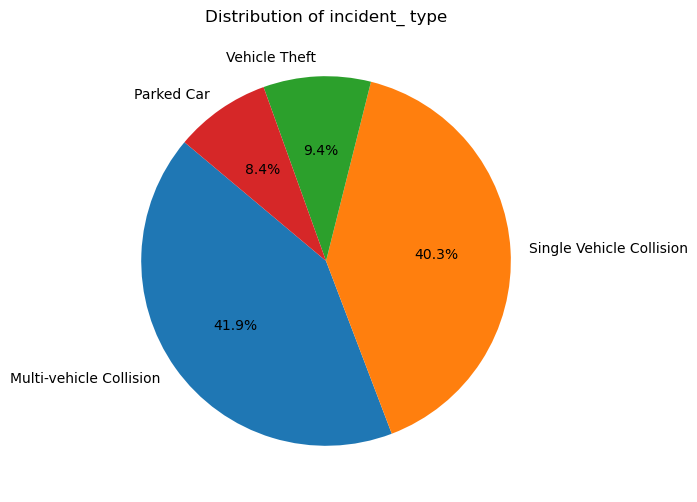

In [31]:
# Calculate the value counts for incident_type
incident_type = df['incident_type'].value_counts()

# Plot the distribution as a pie chart
plt.figure(figsize=(10, 6))
plt.pie(incident_type, labels=incident_type.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of incident_ type')
plt.show()

- Majority of accidents seems to be highest with Multi-vehicle collision followed by single-vehicle collision. 

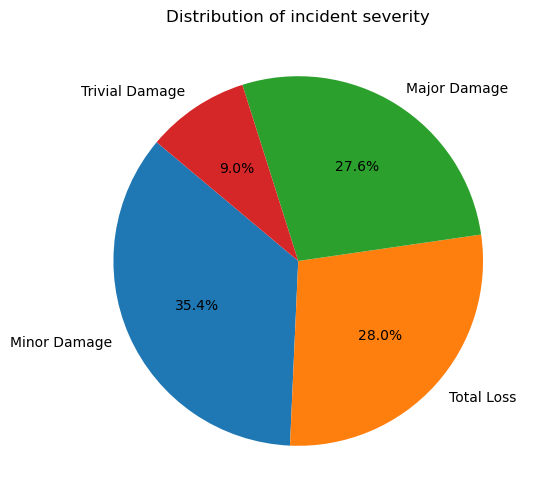

In [32]:
# Calculate the value counts for incident_severity
incident_severity = df['incident_severity'].value_counts()

# Plot the distribution as a pie chart
plt.figure(figsize=(10, 6))
plt.pie(incident_severity, labels=incident_severity.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of incident severity')
plt.show()

- In most of the cases it was found that there was a minor damage. but 28.0% reported to have total loss

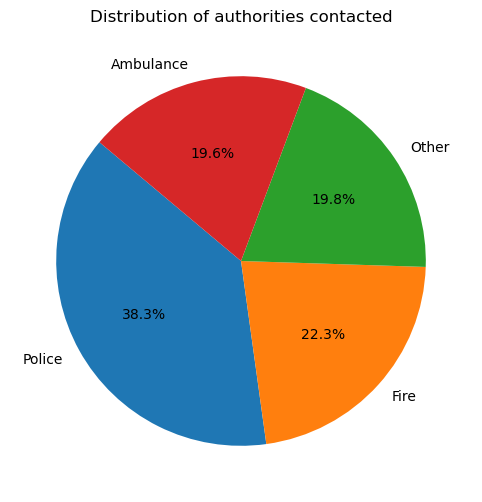

In [33]:
# Calculate the value counts for authorities_contacted
authorities_contacted = df['authorities_contacted'].value_counts()

# Plot the distribution as a pie chart
plt.figure(figsize=(10, 6))
plt.pie(authorities_contacted, labels=authorities_contacted.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of authorities contacted')
plt.show()

- Police were the most popular authority to be contacted post incidents. Fire and ambulance were also called for severe incidents if needed. 

In [34]:
# Finding the maximum and minimum total_claim_amount
max_claim = df['total_claim_amount'].max()
min_claim = df['total_claim_amount'].min()

print(f"The maximum total amount claimed is: ${max_claim}")
print(f"The minimum total amount claimed is: ${min_claim}")

The maximum total amount claimed is: $114920
The minimum total amount claimed is: $100


In [35]:
# Finding the maximum and minimum total_claim_amount
max_claim = df['injury_claim'].max()
min_claim = df['injury_claim'].min()

# Finding the most frequent total_claim_amount
most_frequent_claim_amount = df['injury_claim'].mode()[0]

print(f"The most frequent total claim amount is: ${most_frequent_claim_amount}")
print(f"The maximum total amount claimed is: ${max_claim}")
print(f"The minimum total amount claimed is: ${min_claim}")

The most frequent total claim amount is: $0
The maximum total amount claimed is: $21450
The minimum total amount claimed is: $0


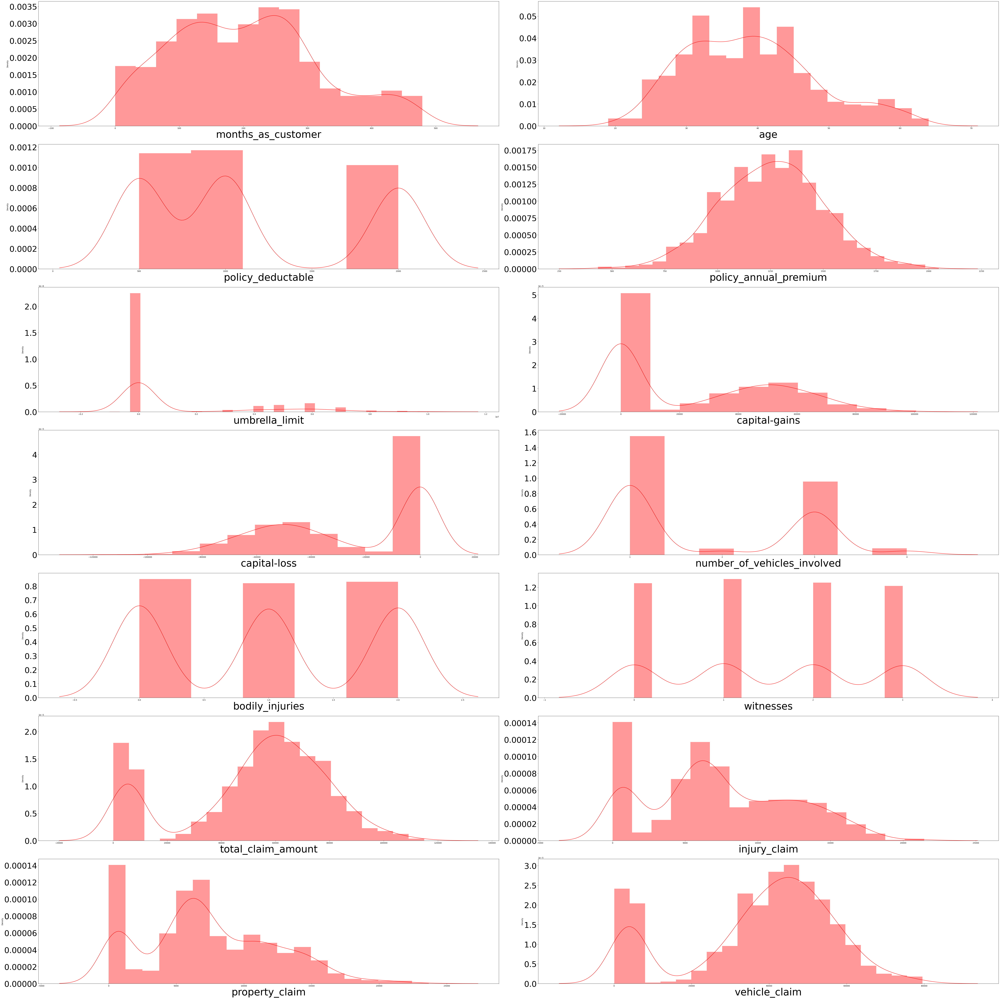

In [37]:
#Letss check how data is disctributed in numerical columns
plt.figure(figsize = (70,70), facecolor="white")
plotnumber= 1
for col in numerical_col:
    if plotnumber<=14:
        ax = plt.subplot (7,2,plotnumber)
        sns.distplot (df[col],color='r')
        plt.xlabel(col,fontsize= 50 )
        plt.yticks(rotation=0,fontsize=40)
    plotnumber+=1
plt.tight_layout()

#### Observations:  
1. The columns Umbrella_limit, capital_gains, and number_of_vehicles_involved exhibit right-skewed data.  
2. The columns Capital_loss, total_claim_amount, and vehicle_claim show left-skewed data.  
3. All other columns are evenly distributed.  

## Bivariate Analysis

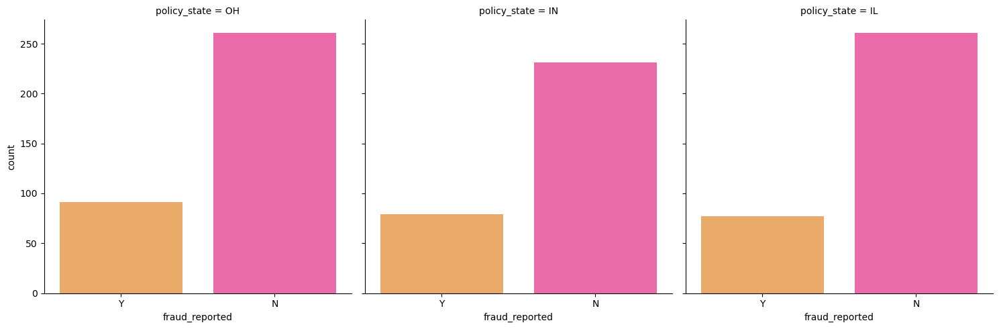

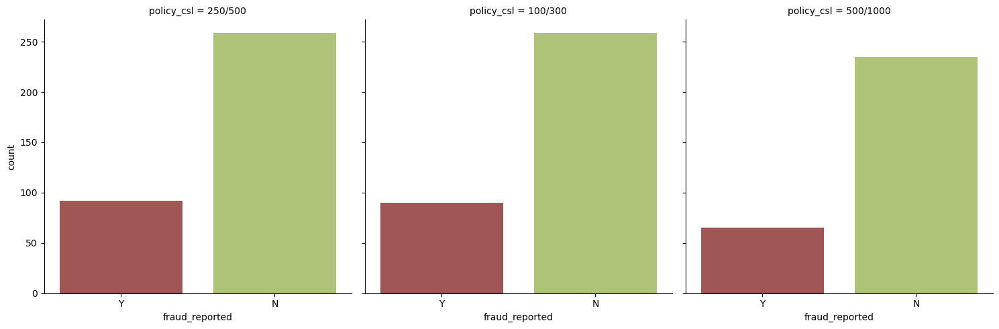

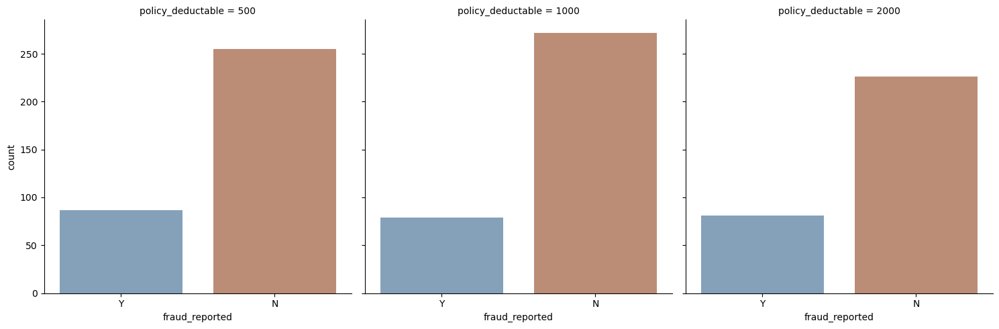

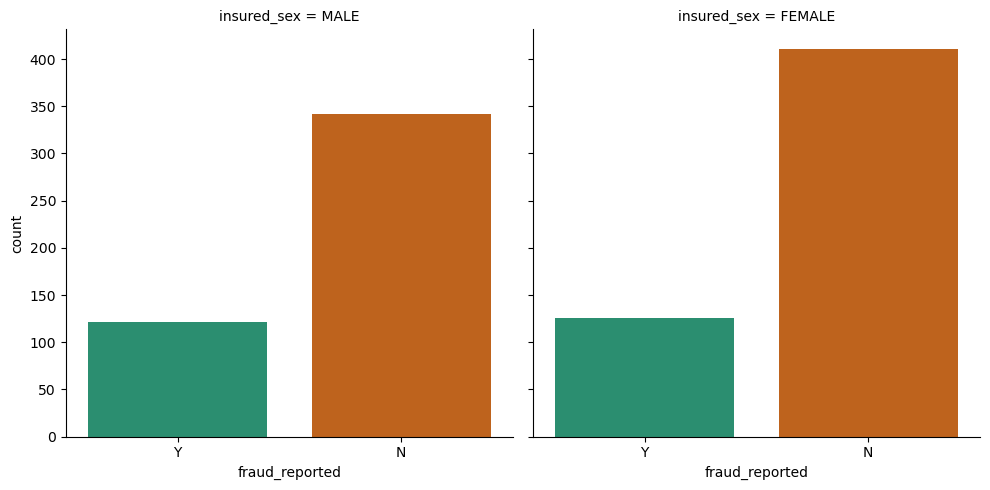

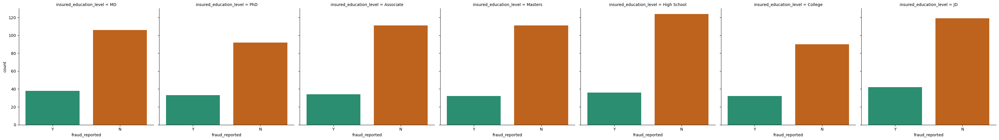

...

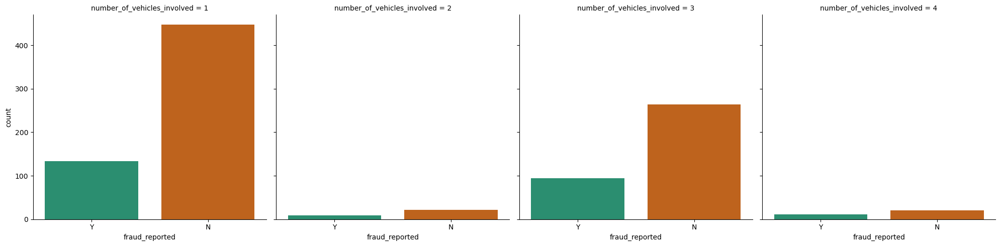

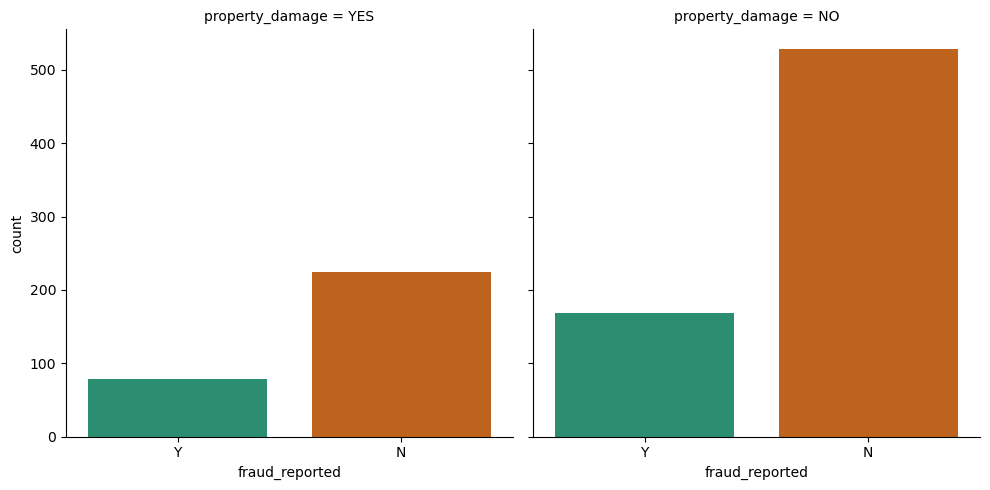

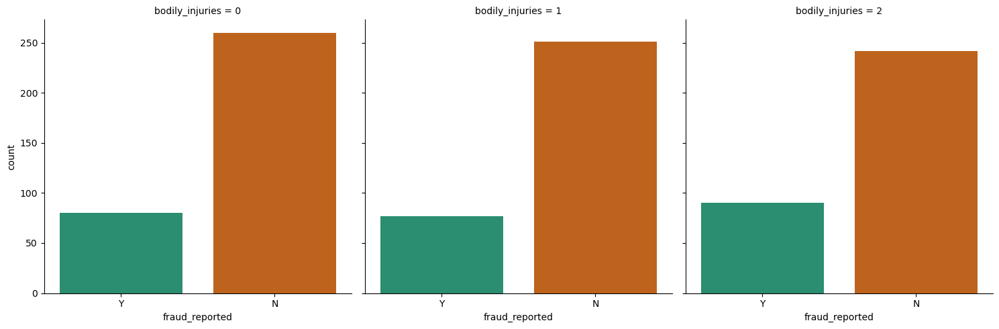

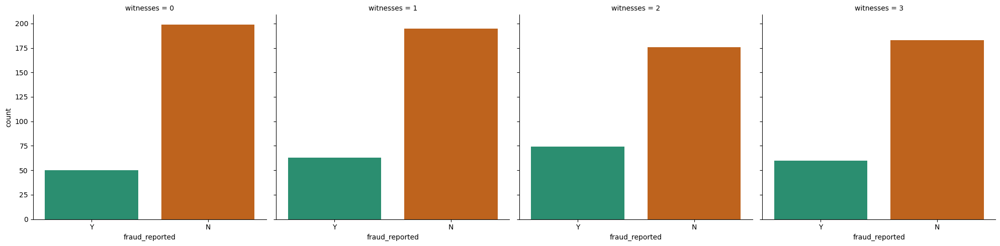

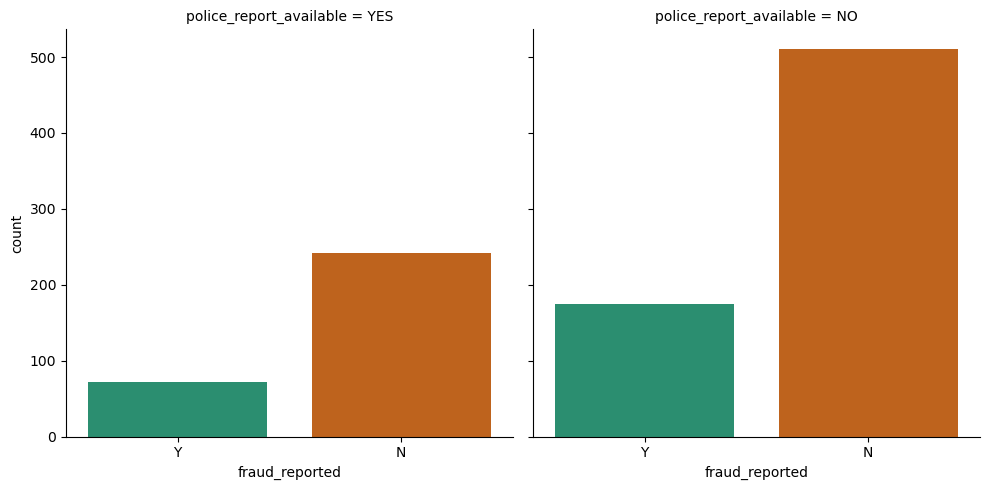

In [39]:
#checking fraud_reported and policy_state
sns.catplot (x="fraud_reported", col="policy_state",data=df, kind="count",palette='spring_r')

#checking fraud_reported,and policy_csl
sns.catplot (x="fraud_reported", col="policy_csl",data=df, kind="count",palette='tab20b_r')

#checking fraud_reported in policy_deductable
sns.catplot (x="fraud_reported", col="policy_deductable",data=df, kind="count",palette='twilight_shifted')

#checking fraud_reported in insured_sex
sns.catplot (x="fraud_reported", col="insured_sex",data=df, kind="count",palette='Dark2')
plt.show()

#checking  fraud_reported in insured_education_level
sns.catplot (x="fraud_reported", col="insured_education_level",data=df, kind="count",palette='Dark2')
plt.show()

#checking  fraud_reported in insured_relationship
sns.catplot (x="fraud_reported", col="insured_relationship",data=df, kind="count",palette='Dark2')
plt.show()

#checking  fraud_reported in incident_type
sns.catplot (x="fraud_reported", col="incident_type",data=df, kind="count",palette='Dark2')
plt.show()

#checking  fraud_reported in collision_type
sns.catplot (x="fraud_reported", col="collision_type",data=df, kind="count",palette='Dark2')
plt.show()

#checking  fraud_reported in incident_severity
sns.catplot (x="fraud_reported", col="incident_severity",data=df, kind="count",palette='Dark2')
plt.show()

#checking  fraud_reported in number_of_vehicles_involved
sns.catplot (x="fraud_reported", col="number_of_vehicles_involved",data=df, kind="count",palette='Dark2')
plt.show()

#checking  fraud_reported in property_damage
sns.catplot (x="fraud_reported", col="property_damage",data=df, kind="count",palette='Dark2')
plt.show()

#checking  fraud_reported in bodily_injuries
sns.catplot (x="fraud_reported", col="bodily_injuries",data=df, kind="count",palette='Dark2')
plt.show()

#checking  fraud_reported in witnesses
sns.catplot (x="fraud_reported", col="witnesses",data=df, kind="count",palette='Dark2')
plt.show()

#checking  fraud_reported in police_report_available
sns.catplot (x="fraud_reported", col="police_report_available",data=df, kind="count",palette='Dark2')
plt.show()

## OBSERVATIONS:  

#### In all instances, fraud cases are fewer than non-fraud cases.

1. For policy_state=IN, the number of fraud cases reported is lower compared to other policy states.  
2. Policy_csl shows a lower count of fraud reports.  
3. Fraud cases are fewer for policy_deductible values of 1000.  
4. The number of fraud cases reported for both males and females is relatively similar.  
5. More fraud cases are reported for individuals with an insured_education_level of MD and JD.  
6. Fraud cases are higher for insured_relationship=other compared to other relationship categories.  
7. Fraud cases are more common for single-vehicle collisions.  
8. Fraud cases for rear collisions are more frequent, though still fewer than non-fraud cases.  
9. Major damage incidents show more fraud cases than non-fraud cases, whereas trivial damage incidents report very few fraud cases.  
10. Fraud cases are more frequent when only one vehicle is involved compared to incidents involving multiple vehicles.  
11. There are a significant number of fraud cases reported when no property damage occurred.  
12. Fraud cases are more likely to be registered when a police report is not available.

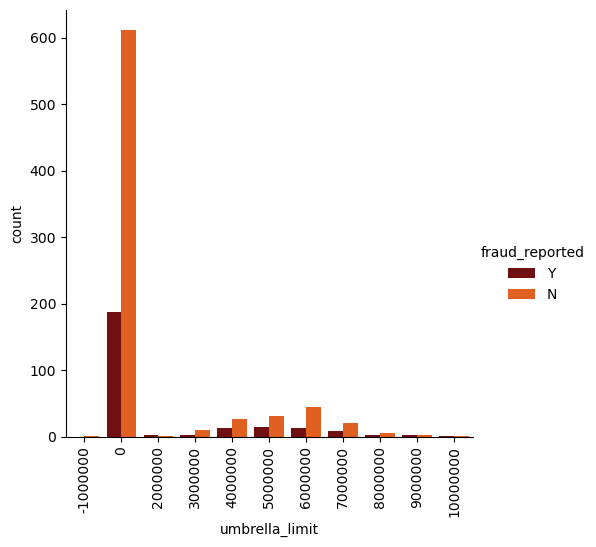

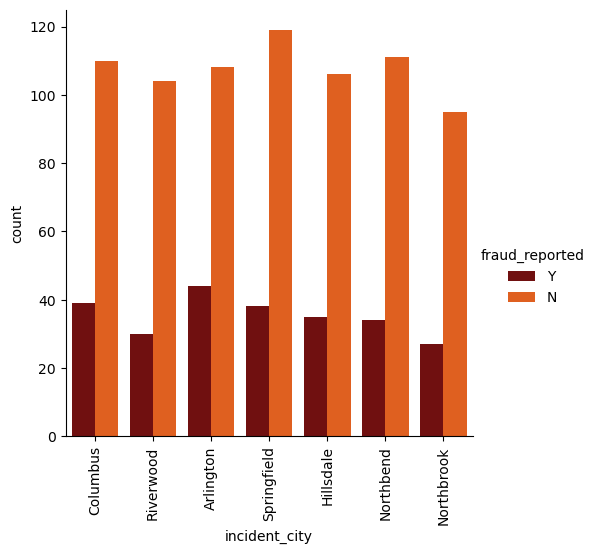

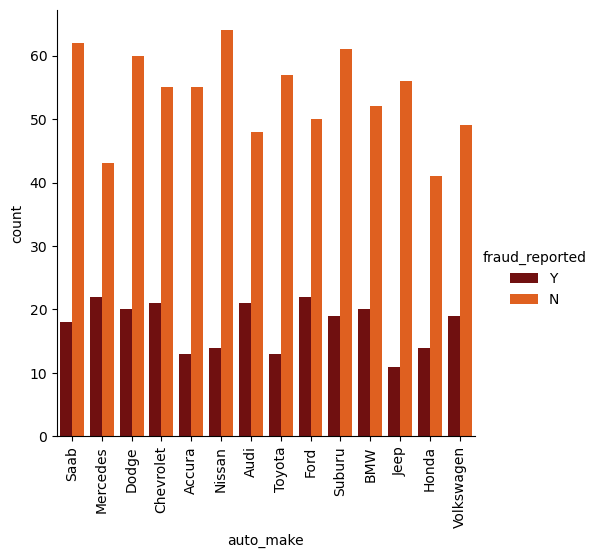

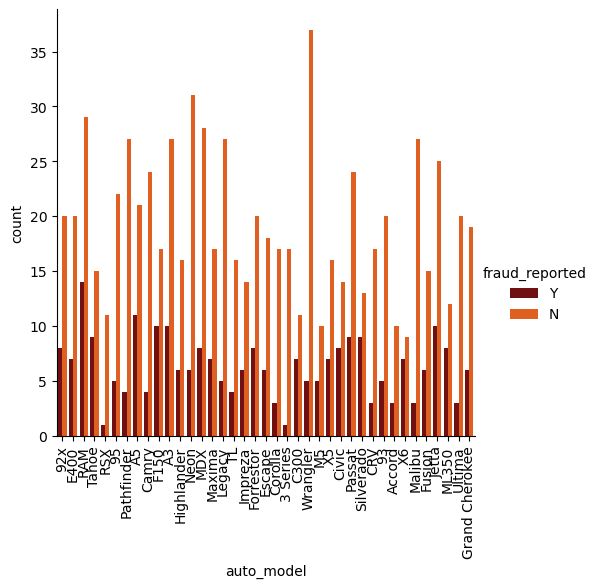

In [40]:
#checking fraud_reported in umbrella_limit
sns.catplot (x="umbrella_limit",hue='fraud_reported', data=df, kind="count",palette='gist_heat')
plt.xticks(rotation=90)
plt.show()

#checking fraud_reported in incident_city
sns.catplot (x="incident_city",hue='fraud_reported', data=df, kind="count",palette='gist_heat')
plt.xticks(rotation=90)
plt.show()

#checking fraud_reported in auto_make
sns.catplot (x="auto_make",hue='fraud_reported', data=df, kind="count",palette='gist_heat')
plt.xticks(rotation=90)
plt.show()

#checking fraud_reported in auto_model
sns.catplot (x="auto_model",hue='fraud_reported', data=df, kind="count",palette='gist_heat')
plt.xticks(rotation=90)
plt.show()

### Descriptive Statistics

In [41]:
df.describe()

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim
count,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,1136.000000,1256.406150,1.101000e+06,25126.100000,-26793.700000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000
std,115.113174,9.140287,611.864673,244.167395,2.297407e+06,27872.187708,28104.096686,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893
min,0.000000,19.000000,500.000000,433.330000,-1.000000e+06,0.000000,-111100.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000
25%,115.750000,32.000000,500.000000,1089.607500,0.000000e+00,0.000000,-51500.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000
50%,199.500000,38.000000,1000.000000,1257.200000,0.000000e+00,0.000000,-23250.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000
75%,276.250000,44.000000,2000.000000,1415.695000,0.000000e+00,51025.000000,0.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000
max,479.000000,64.000000,2000.000000,2047.590000,1.000000e+07,100500.000000,0.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000


### OBSERVATIONS:  
1. The mean is greater than the median for the columns months_as_customer, policy_deductible, capital_gain, injury_claim, and property_claim, indicating that the data is right-skewed in these columns.  
2. For the columns vehicle_claim, total_claim_amount, incident_hour_of_the_day, capital_loss, and policy_annual_premium, the mean is smaller than the median, suggesting that the data is left-skewed.  
3. Almost all columns exhibit a large difference between the maximum value and the third quartile (Q3), indicating the presence of many outliers in the data.

#### Multivariate Analysis

<function matplotlib.pyplot.show(close=None, block=None)>

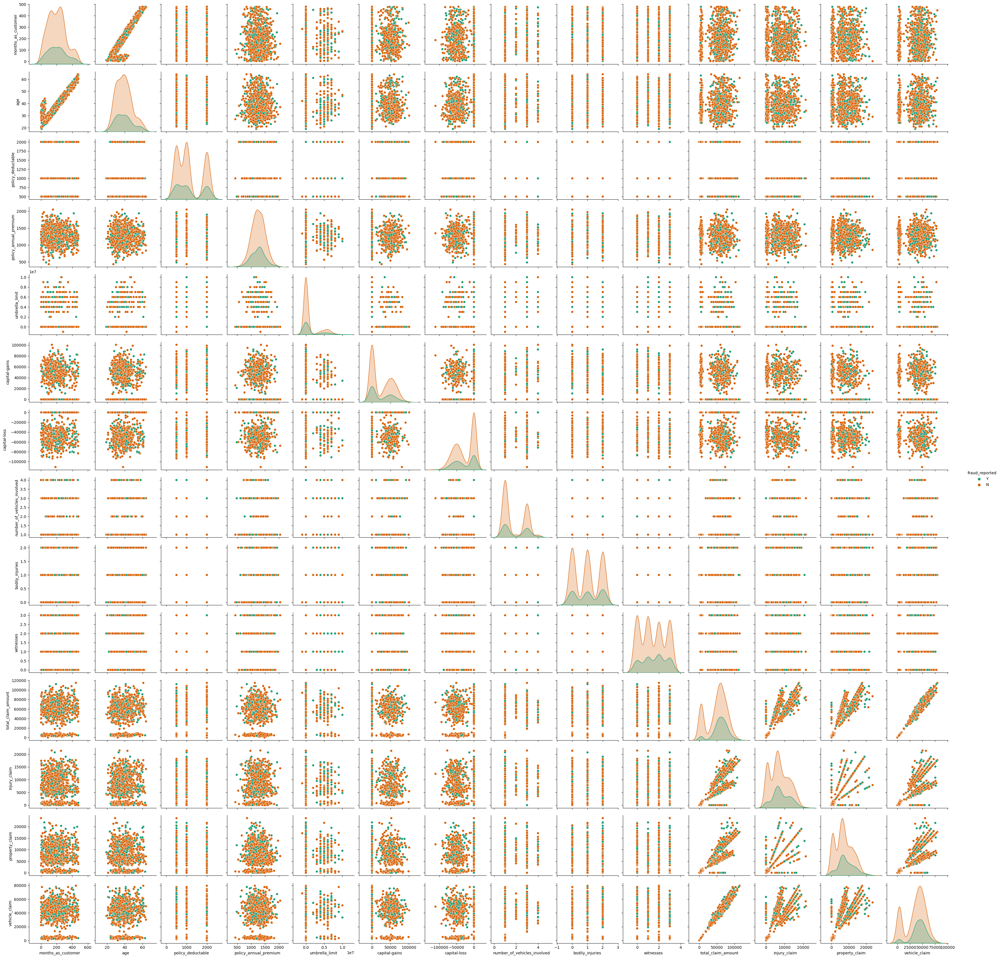

In [42]:
sns.pairplot(df,hue="fraud_reported", palette="Dark2")
plt.show

#### Lets convert Categorical data into Numerical data to Analyse further. 

In [43]:
#Encoding categorical column using ordinal Method
from sklearn.preprocessing import OrdinalEncoder
OE=OrdinalEncoder()
for i in df.columns:
    if df[i].dtypes=='object':
        df[i]=OE.fit_transform(df[i].values.reshape(-1,1))
df

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported
0,328,48,2.0,1.0,1000,1406.91,0,1.0,4.0,2.0,17.0,0.0,53300,0,2.0,2.0,0.0,3.0,4.0,1.0,1,1.0,1,2,1.0,71610,6510,13020,52080,10.0,1.0,1.0
1,228,42,1.0,1.0,2000,1197.22,5000000,1.0,4.0,6.0,15.0,2.0,0,0,3.0,1.0,1.0,3.0,5.0,5.0,1,0.0,0,0,0.0,5070,780,780,3510,8.0,12.0,1.0
2,134,29,2.0,0.0,2000,1413.14,5000000,0.0,6.0,11.0,2.0,3.0,35100,0,0.0,1.0,1.0,3.0,1.0,1.0,3,0.0,2,3,0.0,34650,7700,3850,23100,4.0,30.0,0.0
3,256,41,0.0,1.0,2000,1415.74,6000000,0.0,6.0,1.0,2.0,4.0,48900,-62400,2.0,0.0,0.0,3.0,2.0,0.0,1,0.0,1,2,0.0,63400,6340,6340,50720,3.0,34.0,1.0
4,228,44,0.0,2.0,1000,1583.91,6000000,1.0,0.0,11.0,2.0,4.0,66000,-46000,3.0,1.0,1.0,3.0,1.0,0.0,1,0.0,0,1,0.0,6500,1300,650,4550,0.0,31.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,2.0,2.0,1000,1310.80,0,0.0,5.0,2.0,13.0,4.0,0,0,2.0,0.0,1.0,1.0,0.0,4.0,1,1.0,0,1,0.0,87200,17440,8720,61040,6.0,6.0,0.0
996,285,41,0.0,0.0,1000,1436.79,0,0.0,6.0,9.0,17.0,5.0,70900,0,2.0,1.0,0.0,1.0,4.0,3.0,1,1.0,2,3,0.0,108480,18080,18080,72320,13.0,28.0,0.0
997,130,34,2.0,1.0,500,1383.49,3000000,0.0,5.0,1.0,3.0,2.0,35100,0,0.0,2.0,1.0,3.0,0.0,0.0,3,0.0,2,3,1.0,67500,7500,7500,52500,11.0,19.0,0.0
998,458,62,0.0,2.0,2000,1356.92,5000000,1.0,0.0,5.0,0.0,5.0,0,0,2.0,1.0,0.0,2.0,1.0,0.0,1,0.0,0,1,1.0,46980,5220,5220,36540,1.0,5.0,0.0


## Correlation

In [44]:
cor=df.corr()
cor

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported
months_as_customer,1.000000,0.922098,-0.000328,-0.026819,0.026807,0.005018,0.015498,0.060925,-0.000833,0.009814,-0.093661,0.069727,0.006399,0.020209,-0.017377,-0.072787,-0.059581,0.001784,0.005369,-0.000130,0.014736,0.005488,-0.010162,0.058383,-0.022146,0.062108,0.065329,0.034940,0.061013,0.047655,0.004202,0.020544
age,0.922098,1.000000,-0.014533,-0.015185,0.029188,0.014404,0.018126,0.073337,0.000969,0.017220,-0.081315,0.074832,-0.007075,0.007368,-0.025626,-0.075642,-0.058439,0.004918,0.005770,-0.002291,0.022102,-0.003408,-0.015679,0.052359,-0.020441,0.069863,0.075522,0.060898,0.062588,0.030410,0.017343,0.012143
policy_state,-0.000328,-0.014533,1.000000,0.001027,0.010033,0.012455,-0.029580,-0.020481,-0.034327,-0.031215,-0.038689,-0.018506,0.074551,-0.030338,0.031848,0.052438,-0.026377,-0.008075,0.008723,-0.002077,-0.042263,-0.008465,0.013384,0.022960,0.069017,-0.006002,-0.046290,0.008406,0.001425,0.017124,-0.025253,0.029432
policy_csl,-0.026819,-0.015185,0.001027,1.000000,0.003384,0.023978,0.021636,-0.010757,0.009153,0.015788,-0.005960,-0.030063,0.005249,-0.034612,0.011997,0.020641,0.022530,0.079217,0.032814,0.009333,-0.019403,-0.027634,-0.000595,0.071500,-0.001645,-0.055758,-0.078818,-0.042216,-0.046791,-0.004701,0.047885,-0.037190
policy_deductable,0.026807,0.029188,0.010033,0.003384,1.000000,-0.003245,0.010870,-0.009733,0.015217,-0.046733,0.004061,-0.022945,0.035212,-0.023544,-0.038411,-0.053912,-0.015711,0.007146,0.006517,-0.045117,0.051214,0.015770,-0.022765,0.066639,0.038036,0.022839,0.039107,0.064792,0.005269,-0.035379,-0.003268,0.014817
policy_annual_premium,0.005018,0.014404,0.012455,0.023978,-0.003245,1.000000,-0.006247,0.038853,-0.019715,0.035922,-0.018019,0.001925,-0.013738,0.023547,0.053603,0.036556,-0.011155,-0.051461,0.046434,0.048724,-0.045991,0.080738,0.026780,0.002332,0.021998,0.009094,-0.017633,-0.011654,0.020246,0.000045,-0.031849,-0.014480
umbrella_limit,0.015498,0.018126,-0.029580,0.021636,0.010870,-0.006247,1.000000,0.010688,-0.019357,0.023422,-0.037000,0.077495,-0.047268,-0.024056,0.015966,0.010041,0.009466,0.029926,-0.077492,0.013094,-0.021270,-0.076358,0.022743,-0.006738,-0.044771,-0.040344,-0.045412,-0.023790,-0.038584,-0.004443,0.040256,0.058622
insured_sex,0.060925,0.073337,-0.020481,-0.010757,-0.009733,0.038853,0.010688,1.000000,0.009002,-0.006160,-0.020317,0.002855,-0.020494,-0.021705,0.009952,-0.014293,-0.028168,0.023276,-0.022379,0.014470,0.018793,0.026969,-0.020297,0.042463,0.006992,-0.023727,0.000924,-0.014868,-0.029609,0.026457,-0.018421,0.030873
insured_education_level,-0.000833,0.000969,-0.034327,0.009153,0.015217,-0.019715,-0.019357,0.009002,1.000000,-0.020298,0.021807,-0.023488,0.039912,0.041193,0.013704,-0.019230,-0.006420,-0.015942,-0.005903,-0.018636,-0.003768,-0.048909,-0.012072,0.019211,0.051640,0.074226,0.081880,0.055794,0.068348,0.055202,0.049445,0.008808
insured_occupation,0.009814,0.017220,-0.031215,0.015788,-0.046733,0.035922,0.023422,-0.006160,-0.020298,1.000000,-0.011077,-0.010171,-0.007824,-0.020171,0.003842,0.007401,0.004731,-0.017337,-0.022761,0.000390,-0.015368,-0.016378,-0.000236,-0.014794,-0.025232,0.003692,0.020211,0.003004,-0.000829,0.042621,0.020584,0.001564


<Axes: >

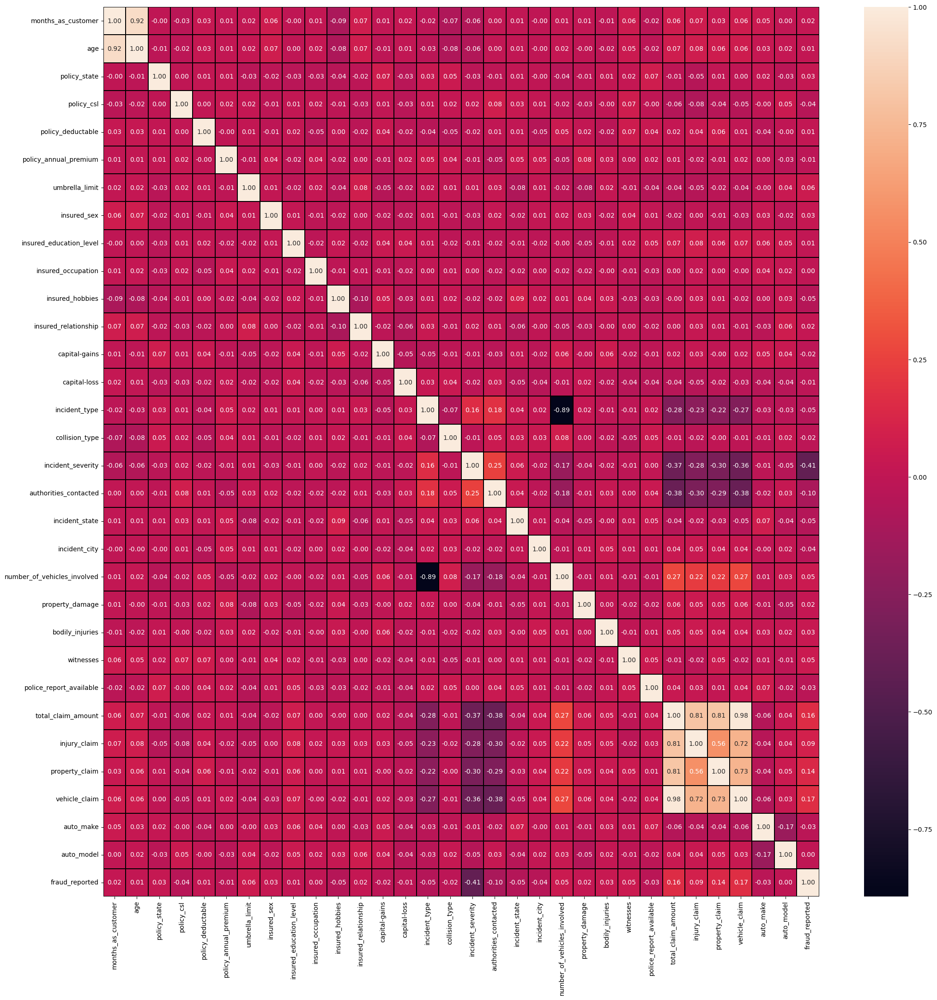

In [45]:
plt.figure(figsize=(25,25))
sns.heatmap(df.corr(),annot=True,linewidths=0.1,linecolor="black",fmt='0.2f')

#### OBSERVATIONS:  
1. The number of vehicles involved shows a strong correlation with the incident_type.  
2. Total claim amount, injury_claim, property_claim, and vehicle_claim exhibit a high degree of correlation with one another.  

In [46]:
#Finding correlation of features with the target variable Loan_Status
cor["fraud_reported"].sort_values(ascending=True)

incident_severity             -0.405988
authorities_contacted         -0.099688
incident_state                -0.051407
incident_type                 -0.050376
insured_hobbies               -0.046838
incident_city                 -0.040403
policy_csl                    -0.037190
police_report_available       -0.027768
auto_make                     -0.027519
capital-gains                 -0.019173
collision_type                -0.017315
capital-loss                  -0.014863
policy_annual_premium         -0.014480
auto_model                     0.000720
insured_occupation             0.001564
insured_education_level        0.008808
age                            0.012143
policy_deductable              0.014817
property_damage                0.017202
months_as_customer             0.020544
insured_relationship           0.021043
policy_state                   0.029432
insured_sex                    0.030873
bodily_injuries                0.033877
witnesses                      0.049497


#### Target variable donot have much correlation with features. 

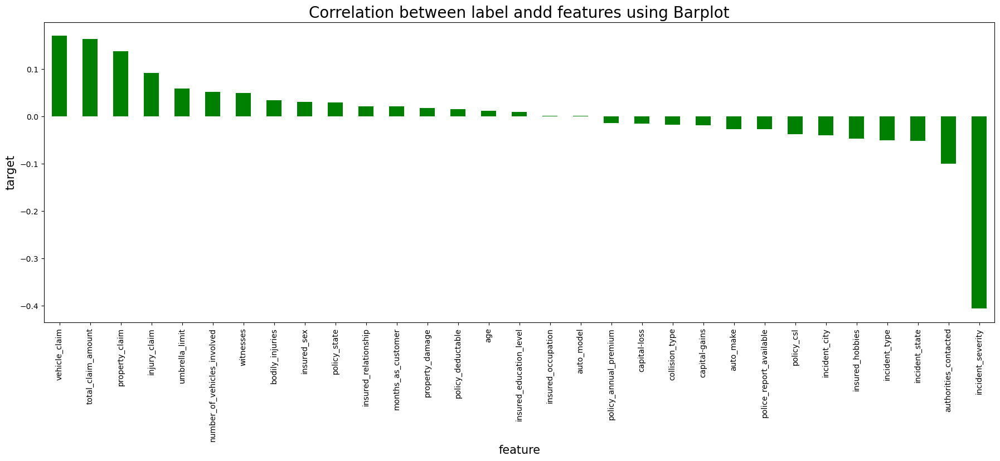

In [49]:
#visualizing correlation between Features and Target by bar plot
plt.figure(figsize=(22,7))
df.corr()["fraud_reported"].sort_values(ascending=False).drop(["fraud_reported"]).plot(kind='bar',color="g")
plt.xlabel("feature",fontsize=15)
plt.ylabel("target",fontsize=15)
plt.title("Correlation between label andd features using Barplot", fontsize=20)
plt.show()

- only incident_severity has modertaee correlation with the Target fraud_reported


### Finding Outliers

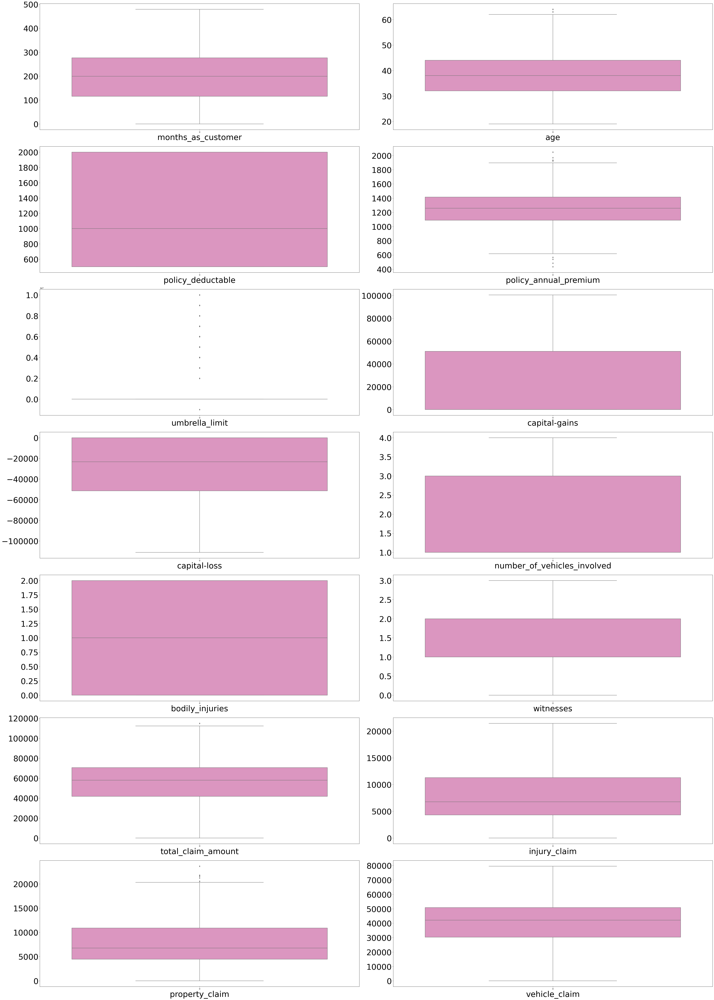

In [50]:
#checking outliers by Boxplot
plt.figure(figsize = (50,70), facecolor="white")
plotnumber= 1
for col in numerical_col:
    if plotnumber<=14:
        ax = plt.subplot (7,2,plotnumber)
        sns.boxplot (df[col],palette='Set2_r')
        plt.xlabel(col,fontsize= 40 )
        plt.yticks(rotation=0,fontsize=40)
    plotnumber+=1
plt.tight_layout()

- Policy annual premium, umbrella limit,property_claim has outliers, and we need to treat the outliers.

### Outlier Removal using Zscore Method

In [51]:
from scipy.stats import zscore
import numpy as np
z=np.abs(zscore(df))
threshold=3
np.where(z>3)

(array([ 31,  48,  88, 115, 119, 229, 248, 262, 314, 430, 458, 500, 503,
        657, 700, 763, 807, 875, 922, 975], dtype=int64),
 array([ 6,  6,  6,  6,  6,  5,  5,  6,  6,  6,  6, 27,  6,  6,  6,  5, 13,
         6,  6,  6], dtype=int64))

In [52]:
df1=df[(z<3).all(axis=1)]
df1

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported
0,328,48,2.0,1.0,1000,1406.91,0,1.0,4.0,2.0,17.0,0.0,53300,0,2.0,2.0,0.0,3.0,4.0,1.0,1,1.0,1,2,1.0,71610,6510,13020,52080,10.0,1.0,1.0
1,228,42,1.0,1.0,2000,1197.22,5000000,1.0,4.0,6.0,15.0,2.0,0,0,3.0,1.0,1.0,3.0,5.0,5.0,1,0.0,0,0,0.0,5070,780,780,3510,8.0,12.0,1.0
2,134,29,2.0,0.0,2000,1413.14,5000000,0.0,6.0,11.0,2.0,3.0,35100,0,0.0,1.0,1.0,3.0,1.0,1.0,3,0.0,2,3,0.0,34650,7700,3850,23100,4.0,30.0,0.0
3,256,41,0.0,1.0,2000,1415.74,6000000,0.0,6.0,1.0,2.0,4.0,48900,-62400,2.0,0.0,0.0,3.0,2.0,0.0,1,0.0,1,2,0.0,63400,6340,6340,50720,3.0,34.0,1.0
4,228,44,0.0,2.0,1000,1583.91,6000000,1.0,0.0,11.0,2.0,4.0,66000,-46000,3.0,1.0,1.0,3.0,1.0,0.0,1,0.0,0,1,0.0,6500,1300,650,4550,0.0,31.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,2.0,2.0,1000,1310.80,0,0.0,5.0,2.0,13.0,4.0,0,0,2.0,0.0,1.0,1.0,0.0,4.0,1,1.0,0,1,0.0,87200,17440,8720,61040,6.0,6.0,0.0
996,285,41,0.0,0.0,1000,1436.79,0,0.0,6.0,9.0,17.0,5.0,70900,0,2.0,1.0,0.0,1.0,4.0,3.0,1,1.0,2,3,0.0,108480,18080,18080,72320,13.0,28.0,0.0
997,130,34,2.0,1.0,500,1383.49,3000000,0.0,5.0,1.0,3.0,2.0,35100,0,0.0,2.0,1.0,3.0,0.0,0.0,3,0.0,2,3,1.0,67500,7500,7500,52500,11.0,19.0,0.0
998,458,62,0.0,2.0,2000,1356.92,5000000,1.0,0.0,5.0,0.0,5.0,0,0,2.0,1.0,0.0,2.0,1.0,0.0,1,0.0,0,1,1.0,46980,5220,5220,36540,1.0,5.0,0.0


In [53]:
#Using IQR Method
from scipy import stats
IQR = stats.iqr(df)
IQR

40.0

In [54]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)

In [55]:
df2 = df[~((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).any(axis=1)]
df2

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported
7,165,37,0.0,0.0,1000,1137.03,0,1.0,0.0,12.0,0.0,4.0,0,0,0.0,0.0,2.0,3.0,5.0,1.0,3,0.0,2,2,1.0,51590,9380,9380,32830,1.0,5.0,0.0
9,212,42,0.0,0.0,500,1315.68,0,1.0,6.0,8.0,4.0,5.0,0,-39300,2.0,1.0,2.0,2.0,0.0,2.0,1,0.0,2,1,0.0,42300,4700,4700,32900,10.0,1.0,0.0
34,149,37,0.0,2.0,500,1415.68,0,1.0,6.0,9.0,19.0,3.0,0,0,2.0,2.0,2.0,1.0,6.0,2.0,1,1.0,0,1,1.0,64800,10800,5400,48600,1.0,4.0,0.0
39,199,37,1.0,1.0,500,1262.08,0,1.0,3.0,12.0,18.0,5.0,48500,0,2.0,0.0,0.0,0.0,0.0,1.0,1,0.0,0,3,0.0,60170,10940,10940,38290,9.0,29.0,1.0
71,222,41,2.0,0.0,2000,1055.53,0,0.0,4.0,1.0,6.0,1.0,37800,-50300,2.0,0.0,2.0,2.0,6.0,4.0,1,0.0,0,2,0.0,61290,6810,6810,47670,6.0,10.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
929,136,32,1.0,0.0,500,1169.62,0,0.0,3.0,11.0,19.0,1.0,0,0,2.0,2.0,0.0,3.0,4.0,0.0,1,1.0,0,0,0.0,55000,10000,10000,35000,12.0,9.0,1.0
954,246,39,1.0,1.0,1000,1416.08,0,0.0,3.0,2.0,19.0,2.0,0,-36600,2.0,1.0,1.0,0.0,6.0,4.0,1,1.0,0,3,0.0,45180,5020,5020,35140,6.0,8.0,0.0
973,230,37,0.0,2.0,1000,1060.74,0,1.0,6.0,12.0,15.0,3.0,0,-51500,2.0,1.0,0.0,0.0,4.0,1.0,1,1.0,2,3,0.0,49100,9820,4910,34370,11.0,19.0,1.0
982,230,43,1.0,2.0,2000,1101.83,0,1.0,2.0,3.0,6.0,2.0,28900,0,0.0,0.0,1.0,3.0,1.0,0.0,3,0.0,0,3,1.0,51900,5190,10380,36330,2.0,22.0,1.0


#### Data loss is less in Z-Score Outliers removal method. Hense we will move further

# Skewness

In [56]:
df1.skew()

months_as_customer             0.362608
age                            0.475385
policy_state                  -0.038157
policy_csl                     0.098248
policy_deductable              0.476090
policy_annual_premium          0.035964
umbrella_limit                 1.801424
insured_sex                    0.139324
insured_education_level        0.006286
insured_occupation            -0.055360
insured_hobbies               -0.061488
insured_relationship           0.078339
capital-gains                  0.466619
capital-loss                  -0.376884
incident_type                  0.090563
collision_type                -0.032778
incident_severity              0.277726
authorities_contacted         -0.296476
incident_state                -0.149255
incident_city                  0.043882
number_of_vehicles_involved    0.509725
property_damage                0.853093
bodily_injuries                0.003757
witnesses                      0.026211
police_report_available        0.796221


In [57]:
from scipy.stats import skew
# Original skewness
original_skew = skew(df1['umbrella_limit'])
print(f"Original skewness: {original_skew}")

# Shift the data to make all values positive if necessary
shifted_data = df1['umbrella_limit'] - df1['umbrella_limit'].min() + 1

# Log transformation
log_transformed = np.log(shifted_data)
log_skew = skew(log_transformed)
print(f"Log-transformed skewness: {log_skew}")

# Square root transformation
sqrt_transformed = np.sqrt(shifted_data)
sqrt_skew = skew(sqrt_transformed)
print(f"Square root-transformed skewness: {sqrt_skew}")

# Box-Cox transformation
from scipy.stats import boxcox
boxcox_transformed, _ = boxcox(shifted_data)
boxcox_skew = skew(boxcox_transformed)
print(f"Box-Cox-transformed skewness: {boxcox_skew}")

# Choose the transformation closest to 0.5
if abs(log_skew - 0.5) < abs(sqrt_skew - 0.5) and abs(log_skew - 0.5) < abs(boxcox_skew - 0.5):
    df1['umbrella_limit'] = log_transformed
    print("Applied log transformation")
elif abs(sqrt_skew - 0.5) < abs(log_skew - 0.5) and abs(sqrt_skew - 0.5) < abs(boxcox_skew - 0.5):
    df1['umbrella_limit'] = sqrt_transformed
    print("Applied square root transformation")
else:
    df1['umbrella_limit'] = boxcox_transformed
    print("Applied Box-Cox transformation")

# Verify the final skewness
final_skew = skew(df1['umbrella_limit'])
print(f"Final skewness: {final_skew}")

Original skewness: 1.7986651921722496
Log-transformed skewness: -3.742486995972897
Square root-transformed skewness: 1.6861984445734302
Box-Cox-transformed skewness: 0.4102537226046339
Applied Box-Cox transformation
Final skewness: 0.4102537226046339


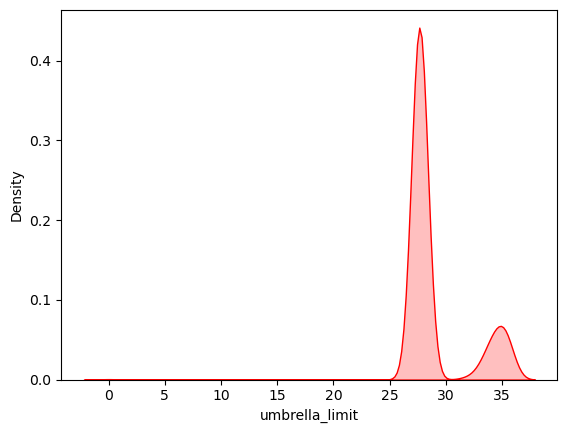

In [59]:
#Let check if the skewneww is removed. 
sns.distplot(df1["umbrella_limit"], color='r', kde_kws={"shade":True}, hist=False)
plt.show()

In [60]:
df1.skew()

months_as_customer             0.362608
age                            0.475385
policy_state                  -0.038157
policy_csl                     0.098248
policy_deductable              0.476090
policy_annual_premium          0.035964
umbrella_limit                 0.410883
insured_sex                    0.139324
insured_education_level        0.006286
insured_occupation            -0.055360
insured_hobbies               -0.061488
insured_relationship           0.078339
capital-gains                  0.466619
capital-loss                  -0.376884
incident_type                  0.090563
collision_type                -0.032778
incident_severity              0.277726
authorities_contacted         -0.296476
incident_state                -0.149255
incident_city                  0.043882
number_of_vehicles_involved    0.509725
property_damage                0.853093
bodily_injuries                0.003757
witnesses                      0.026211
police_report_available        0.796221


### Separating Features and Label

In [61]:
x=df1.drop("fraud_reported",axis=1)
y=df1["fraud_reported"]

In [62]:
x

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model
0,328,48,2.0,1.0,1000,1406.91,27.668071,1.0,4.0,2.0,17.0,0.0,53300,0,2.0,2.0,0.0,3.0,4.0,1.0,1,1.0,1,2,1.0,71610,6510,13020,52080,10.0,1.0
1,228,42,1.0,1.0,2000,1197.22,34.520360,1.0,4.0,6.0,15.0,2.0,0,0,3.0,1.0,1.0,3.0,5.0,5.0,1,0.0,0,0,0.0,5070,780,780,3510,8.0,12.0
2,134,29,2.0,0.0,2000,1413.14,34.520360,0.0,6.0,11.0,2.0,3.0,35100,0,0.0,1.0,1.0,3.0,1.0,1.0,3,0.0,2,3,0.0,34650,7700,3850,23100,4.0,30.0
3,256,41,0.0,1.0,2000,1415.74,35.163817,0.0,6.0,1.0,2.0,4.0,48900,-62400,2.0,0.0,0.0,3.0,2.0,0.0,1,0.0,1,2,0.0,63400,6340,6340,50720,3.0,34.0
4,228,44,0.0,2.0,1000,1583.91,35.163817,1.0,0.0,11.0,2.0,4.0,66000,-46000,3.0,1.0,1.0,3.0,1.0,0.0,1,0.0,0,1,0.0,6500,1300,650,4550,0.0,31.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,2.0,2.0,1000,1310.80,27.668071,0.0,5.0,2.0,13.0,4.0,0,0,2.0,0.0,1.0,1.0,0.0,4.0,1,1.0,0,1,0.0,87200,17440,8720,61040,6.0,6.0
996,285,41,0.0,0.0,1000,1436.79,27.668071,0.0,6.0,9.0,17.0,5.0,70900,0,2.0,1.0,0.0,1.0,4.0,3.0,1,1.0,2,3,0.0,108480,18080,18080,72320,13.0,28.0
997,130,34,2.0,1.0,500,1383.49,32.870385,0.0,5.0,1.0,3.0,2.0,35100,0,0.0,2.0,1.0,3.0,0.0,0.0,3,0.0,2,3,1.0,67500,7500,7500,52500,11.0,19.0
998,458,62,0.0,2.0,2000,1356.92,34.520360,1.0,0.0,5.0,0.0,5.0,0,0,2.0,1.0,0.0,2.0,1.0,0.0,1,0.0,0,1,1.0,46980,5220,5220,36540,1.0,5.0


In [63]:
y

0      1.0
1      1.0
2      0.0
3      1.0
4      0.0
      ... 
995    0.0
996    0.0
997    0.0
998    0.0
999    0.0
Name: fraud_reported, Length: 980, dtype: float64

### Feature Scaling using Standard Scaling Method (Normalization)

In [64]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
X

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model
0,1.069568,0.983352,1.179821,0.067231,-0.224643,0.620031,-0.444463,1.071971,0.532901,-1.156087,1.275279,-1.437247,1.003849,0.955432,0.761515,1.345272,-1.259947,1.066427,0.351070,-0.973760,-0.820087,1.512809,0.002498,0.466378,1.473608,0.718507,-0.187627,1.176015,0.753824,0.851959,-1.640447
1,0.202726,0.329711,-0.024580,0.067231,1.412161,-0.248448,1.922093,1.071971,0.532901,-0.160292,0.923775,-0.248136,-0.906228,0.955432,1.687428,-0.029459,-0.195509,1.066427,0.814748,0.990800,-0.820087,-0.661022,-1.221626,-1.333033,-0.678606,-1.808821,-1.361005,-1.378984,-1.824679,0.355279,-0.651740
2,-0.612105,-1.086511,1.179821,-1.175916,1.412161,0.645834,1.922093,-0.932861,1.556905,1.084451,-1.361003,0.346420,0.351628,0.955432,-1.090309,-0.029459,-0.195509,1.066427,-1.039963,-0.973760,1.144914,-0.661022,1.226623,1.366083,-0.678606,-0.685311,0.056059,-0.738147,-0.784678,-0.638083,0.966145
3,0.445442,0.220771,-1.228980,0.067231,1.412161,0.656603,2.144321,-0.932861,1.556905,-1.405036,-1.361003,0.940975,0.846169,-1.278119,0.761515,-1.404189,-1.259947,1.066427,-0.576285,-1.464901,-0.820087,-0.661022,0.002498,0.466378,-0.678606,0.406674,-0.222439,-0.218380,0.681623,-0.886423,1.325675
4,0.202726,0.547591,-1.228980,1.310379,-0.224643,1.353117,2.144321,1.071971,-1.515109,1.084451,-1.361003,0.940975,1.458971,-0.691096,1.687428,-0.029459,-0.195509,1.066427,-1.039963,-1.464901,-0.820087,-0.661022,-1.221626,-0.433327,-0.678606,-1.754507,-1.254521,-1.406121,-1.769467,-1.631444,1.056027
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
975,-1.747669,-0.106050,1.179821,1.310379,-0.224643,0.221970,-0.444463,-0.932861,1.044903,-1.156087,0.572270,0.940975,-0.906228,0.955432,0.761515,-1.404189,-0.195509,-0.662437,-1.503641,0.499660,-0.820087,1.512809,-1.221626,-0.433327,-0.678606,1.310648,2.050597,0.278425,1.229496,-0.141402,-1.191035
976,0.696826,0.220771,-1.228980,-1.175916,-0.224643,0.743786,-0.444463,-0.932861,1.556905,0.586554,1.275279,1.535531,1.634569,0.955432,0.761515,-0.029459,-1.259947,-0.662437,0.351070,0.008520,-0.820087,1.512809,1.226623,1.366083,-0.678606,2.118906,2.181655,2.232248,1.828332,1.596980,0.786380
977,-0.646779,-0.541810,1.179821,0.067231,-1.043045,0.523032,1.352245,-0.932861,1.044903,-1.405036,-1.185251,-0.248136,0.351628,0.955432,-1.090309,1.345272,-0.195509,1.066427,-1.503641,-1.464901,1.144914,-0.661022,1.226623,1.366083,1.473608,0.562400,0.015103,0.023760,0.776121,1.100300,-0.022562
978,2.196463,2.508513,-1.228980,1.310379,1.412161,0.412986,1.922093,1.071971,-1.515109,-0.409241,-1.712507,1.535531,-0.906228,0.955432,0.761515,-0.029459,-1.259947,0.201995,-1.039963,-1.464901,-0.820087,-0.661022,-1.221626,-0.433327,1.473608,-0.216992,-0.451791,-0.452171,-0.071170,-1.383104,-1.280917


### Checking Variace inflation factor(VIF)

In [65]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
v=variance_inflation_factor
vif=pd.DataFrame()
vif["VIF Values"]=[v(X.values,i) for i in range(len(X.columns))]
vif["Features"]=x.columns
vif

,VIF Values,Features
0,6.884467,months_as_customer
1,6.886079,age
2,1.028205,policy_state
3,1.027041,policy_csl
4,1.036118,policy_deductable
5,1.031240,policy_annual_premium
6,1.034769,umbrella_limit
7,1.022195,insured_sex
8,1.032803,insured_education_level
9,1.013859,insured_occupation


#### It has been observed that 'total_claim_amount' is the sum of the three other claims: 'injury_claim', 'property_claim', and 'vehicle_claim'. Therefore, we will drop 'total_claim_amount' and then check the VIF (Variance Inflation Factor) values.

In [66]:
#Droping Temp3pm col first 
X.drop("total_claim_amount", axis=1,inplace=True)

In [67]:
vif=pd.DataFrame()
vif["VIF Values"]=[v(X.values,i) for i in range(len(X.columns))]
vif["Features"]=X.columns
vif

,VIF Values,Features
0,6.884467,months_as_customer
1,6.886079,age
2,1.028205,policy_state
3,1.027041,policy_csl
4,1.036118,policy_deductable
5,1.031240,policy_annual_premium
6,1.034769,umbrella_limit
7,1.022195,insured_sex
8,1.032803,insured_education_level
9,1.013859,insured_occupation


#### In Standard Scaler technique we see that the vif values have minimized and are less than 10. Hense the multicollinearity issue is solved

#### We can proceed further

In [68]:
y.value_counts()

fraud_reported
0.0    740
1.0    240
Name: count, dtype: int64

#### The target variable is imbalanced and hense will have to use SMOTE method to Balance the Data

In [70]:
from imblearn.over_sampling import SMOTE
SM=SMOTE()
x1, y1 = SM.fit_resample(X,y)

In [71]:
#checking value count of target column
y1.value_counts()

fraud_reported
1.0    740
0.0    740
Name: count, dtype: int64

In [72]:
print("Shape of x1:", x1.shape)
print("Shape of y1:", y1.shape)

Shape of x1: (1480, 30)
Shape of y1: (1480,)


# Model Building

In [73]:
from sklearn.linear_model import LogisticRegression

from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier

from sklearn.metrics import accuracy_score,confusion_matrix,classification_report,precision_score,recall_score,f1_score,roc_curve
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,BaggingClassifier,GradientBoostingClassifier,ExtraTreesClassifier

from sklearn.model_selection import GridSearchCV

import warnings
from sklearn.model_selection import cross_val_score
warnings.filterwarnings('ignore')

## Train Test Split 

In [74]:
from sklearn.model_selection import train_test_split
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test= train_test_split(x1,y1,test_size=0.20,random_state=i)
    RFR=RandomForestClassifier()
    RFR.fit(x_train,y_train)
    pred=RFR.predict(x_test)
    acc=accuracy_score(y_test,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is", maxAccu,"at random_state", maxRS)

Best accuracy is 0.9358108108108109 at random_state 22


In [75]:
#Creating train test Split 
x_train,x_test,y_train,y_test= train_test_split(x1,y1,test_size=0.20,random_state=22)

In [76]:
print('Size of x_train : ', x_train.shape)
print('Size of y_train : ', y_train.shape)
print('Size of x_test : ', x_test.shape)
print('Size of y_test : ', y_test.shape)
print('predicted_values:', pred)

Size of x_train :  (1184, 30)
Size of y_train :  (1184,)
Size of x_test :  (296, 30)
Size of y_test :  (296,)
predicted_values: [0. 1. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 0. 1. 0. 1. 0. 1. 1.
 1. 1. 0. 0. 1. 0. 1. 0. 1. 0. 0. 1. 0. 1. 1. 1. 1. 0. 0. 1. 0. 1. 1. 0.
 1. 0. 1. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 0. 0. 0. 0. 0.
 0. 1. 0. 1. 1. 1. 1. 1. 0. 0. 1. 1. 0. 0. 1. 0. 0. 1. 1. 0. 1. 0. 1. 0.
 1. 1. 1. 0. 0. 1. 0. 0. 1. 1. 1. 1. 0. 0. 0. 1. 1. 0. 1. 0. 1. 1. 1. 1.
 0. 0. 1. 0. 0. 0. 0. 1. 0. 1. 0. 0. 1. 0. 0. 0. 0. 1. 0. 1. 1. 1. 0. 1.
 0. 0. 0. 0. 1. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 1. 1. 1. 0. 1. 1. 1.
 0. 1. 0. 0. 1. 1. 0. 1. 0. 0. 1. 1. 1. 0. 0. 1. 1. 1. 1. 0. 1. 1. 0. 1.
 0. 0. 1. 1. 1. 1. 1. 0. 1. 0. 1. 0. 1. 1. 1. 0. 1. 0. 0. 0. 1. 1. 1. 0.
 0. 0. 0. 1. 0. 0. 1. 1. 1. 0. 0. 0. 0. 0. 1. 0. 0. 1. 1. 1. 0. 1. 0. 0.
 1. 0. 1. 0. 1. 1. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 1. 0. 0. 1. 1. 0. 1. 0.
 1. 0. 1. 0. 1. 0. 1. 1. 1. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.

### Random Forest Classifier

In [77]:
RFC=RandomForestClassifier()
RFC.fit(x_train,y_train)
predRFC=RFC.predict(x_test)
print(accuracy_score(y_test,predRFC))
print(confusion_matrix(y_test,predRFC))
print(classification_report(y_test,predRFC))
#checking cv score for Random Forest classifier
score1=cross_val_score(RFC,x1,y1)
print(score1)
print(score1.mean())
print("Difference between Accuraccy_Score and CVS is =", accuracy_score(y_test,predRFC)-score1.mean())

0.9256756756756757
[[143  10]
 [ 12 131]]
              precision    recall  f1-score   support

         0.0       0.92      0.93      0.93       153
         1.0       0.93      0.92      0.92       143

    accuracy                           0.93       296
   macro avg       0.93      0.93      0.93       296
weighted avg       0.93      0.93      0.93       296

[0.76689189 0.84121622 0.92567568 0.92905405 0.93581081]
0.8797297297297296
Difference between Accuraccy_Score and CVS is = 0.04594594594594603


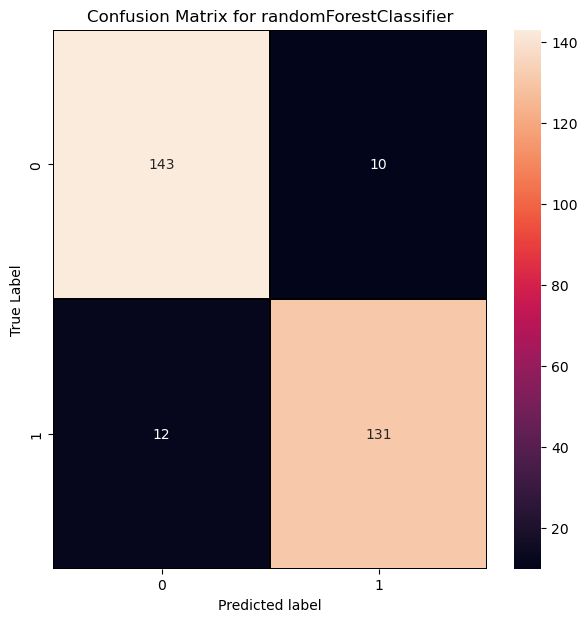

In [78]:
#Lets plot confusion mTatrix for RandomForestClassifier
cm=confusion_matrix(y_test,predRFC)
x_axis_labels=["0","1"]
y_axis_labels= ["0","1"]
f, ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm,annot=True, linewidths=0.2, linecolor="black",fmt=".0f",ax=ax, xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("Predicted label")
plt.ylabel("True Label")
plt.title("Confusion Matrix for randomForestClassifier")
plt.show()

### SVC

In [79]:
svc=SVC()
svc.fit(x_train,y_train)
predsvc=svc.predict(x_test)
print(accuracy_score(y_test,predsvc))
print(confusion_matrix(y_test,predsvc))
print(classification_report(y_test,predsvc))
#checking cv score for Support Vector classifier
score2=cross_val_score(svc,x1,y1)
print(score2)
print(score2.mean())
print("Difference between Accuraccy_Score and CVS is =", accuracy_score(y_test,predsvc)-score2.mean())

0.875
[[133  20]
 [ 17 126]]
              precision    recall  f1-score   support

         0.0       0.89      0.87      0.88       153
         1.0       0.86      0.88      0.87       143

    accuracy                           0.88       296
   macro avg       0.87      0.88      0.87       296
weighted avg       0.88      0.88      0.88       296

[0.80067568 0.8277027  0.84797297 0.88851351 0.86824324]
0.8466216216216218
Difference between Accuraccy_Score and CVS is = 0.0283783783783782


### Gradient Boosting Classifier

In [80]:
GB=GradientBoostingClassifier()
GB.fit(x_train,y_train)
predGB=GB.predict(x_test)
print(accuracy_score(y_test,predGB))
print(confusion_matrix(y_test,predGB))
print(classification_report(y_test,predGB))
#checking cv score for Gradient Boosting classifier
score3=cross_val_score(GB,x1,y1)
print(score3)
print(score3.mean())
print("Difference between Accuraccy_Score and CVS is =", accuracy_score(y_test,predGB)-score3.mean())

0.8986486486486487
[[138  15]
 [ 15 128]]
              precision    recall  f1-score   support

         0.0       0.90      0.90      0.90       153
         1.0       0.90      0.90      0.90       143

    accuracy                           0.90       296
   macro avg       0.90      0.90      0.90       296
weighted avg       0.90      0.90      0.90       296

[0.77027027 0.85135135 0.91891892 0.92905405 0.92905405]
0.8797297297297296
Difference between Accuraccy_Score and CVS is = 0.01891891891891906


### Adaboost Classifier

In [81]:
ABC=AdaBoostClassifier()
ABC.fit(x_train,y_train)
predABC=ABC.predict(x_test)
print(accuracy_score(y_test,predABC))
print(confusion_matrix(y_test,predABC))
print(classification_report(y_test,predABC))
#checking cv score for AdaBoosting classifier
score4=cross_val_score(ABC,x1,y1)
print(score4)
print(score4.mean())
print("Difference between Accuraccy_Score and CVS is =", accuracy_score(y_test,predABC)-score4.mean())

0.8851351351351351
[[140  13]
 [ 21 122]]
              precision    recall  f1-score   support

         0.0       0.87      0.92      0.89       153
         1.0       0.90      0.85      0.88       143

    accuracy                           0.89       296
   macro avg       0.89      0.88      0.88       296
weighted avg       0.89      0.89      0.88       296

[0.66554054 0.78378378 0.89527027 0.9222973  0.92567568]
0.8385135135135136
Difference between Accuraccy_Score and CVS is = 0.046621621621621534


### Logistic Regression 

In [82]:
LR=LogisticRegression()
LR.fit(x_train,y_train)
predLR=LR.predict(x_test)
print(accuracy_score(y_test,predLR))
print(confusion_matrix(y_test,predLR))
print(classification_report(y_test,predLR))
#checking cv score for Logistic regresssion
score5=cross_val_score(LR,x1,y1)
print(score5)
print(score5.mean())
print("Difference between Accuraccy_Score and CVS is =", accuracy_score(y_test,predLR)-score5.mean())

0.7804054054054054
[[118  35]
 [ 30 113]]
              precision    recall  f1-score   support

         0.0       0.80      0.77      0.78       153
         1.0       0.76      0.79      0.78       143

    accuracy                           0.78       296
   macro avg       0.78      0.78      0.78       296
weighted avg       0.78      0.78      0.78       296

[0.71621622 0.71621622 0.76013514 0.74662162 0.75337838]
0.7385135135135135
Difference between Accuraccy_Score and CVS is = 0.04189189189189191


### Bagging Classifier

In [83]:
BC=BaggingClassifier()
BC.fit(x_train,y_train)
predBC=BC.predict(x_test)
print(accuracy_score(y_test,predBC))
print(confusion_matrix(y_test,predBC))
print(classification_report(y_test,predBC))
#checking cv score for Bagging classifier
score6=cross_val_score(BC,x1,y1)
print(score6)
print(score6.mean())
print("Difference between Accuraccy_Score and CVS is =", accuracy_score(y_test,predBC)-score6.mean())

0.8986486486486487
[[138  15]
 [ 15 128]]
              precision    recall  f1-score   support

         0.0       0.90      0.90      0.90       153
         1.0       0.90      0.90      0.90       143

    accuracy                           0.90       296
   macro avg       0.90      0.90      0.90       296
weighted avg       0.90      0.90      0.90       296

[0.82432432 0.84797297 0.90878378 0.92567568 0.91554054]
0.8844594594594595
Difference between Accuraccy_Score and CVS is = 0.01418918918918921


### Extra Tree Classifier

In [84]:
ET=ExtraTreesClassifier()
ET.fit(x_train,y_train)
predET=ET.predict(x_test)
print(accuracy_score(y_test,predET))
print(confusion_matrix(y_test,predET))
print(classification_report(y_test,predET))
#checking cv score for Extra Tree classifier
score7=cross_val_score(ET,x1,y1)
print(score7)
print(score7.mean())
print("Difference between Accuraccy_Score and CVS is =", accuracy_score(y_test,predET)-score7.mean())

0.9391891891891891
[[144   9]
 [  9 134]]
              precision    recall  f1-score   support

         0.0       0.94      0.94      0.94       153
         1.0       0.94      0.94      0.94       143

    accuracy                           0.94       296
   macro avg       0.94      0.94      0.94       296
weighted avg       0.94      0.94      0.94       296

[0.88175676 0.90540541 0.93243243 0.94594595 0.94594595]
0.9222972972972974
Difference between Accuraccy_Score and CVS is = 0.016891891891891775


### Decision Tree Classifier 

In [85]:
from sklearn.tree import DecisionTreeClassifier
DTC =DecisionTreeClassifier()
DTC.fit(x_train,y_train)
predDTC=DTC.predict(x_test)
print(accuracy_score(y_test,predDTC))
print(confusion_matrix(y_test,predDTC))
print(classification_report(y_test,predDTC))
#checking cv score for Decision Tree classifier
score8=cross_val_score(DTC,x1,y1)
print(score8)
print(score8.mean())
print("Difference between Accuraccy_Score and CVS is =", accuracy_score(y_test,predDTC)-score8.mean())

0.8581081081081081
[[131  22]
 [ 20 123]]
              precision    recall  f1-score   support

         0.0       0.87      0.86      0.86       153
         1.0       0.85      0.86      0.85       143

    accuracy                           0.86       296
   macro avg       0.86      0.86      0.86       296
weighted avg       0.86      0.86      0.86       296

[0.72972973 0.76013514 0.86486486 0.90540541 0.90878378]
0.8337837837837838
Difference between Accuraccy_Score and CVS is = 0.024324324324324298


### KNN

In [86]:
knn =KNeighborsClassifier()
knn.fit(x_train,y_train)
predknn=knn.predict(x_test)
print(accuracy_score(y_test,predknn))
print(confusion_matrix(y_test,predknn))
print(classification_report(y_test,predknn))
#checking cv score for K Neighbors Classifier
score9=cross_val_score(knn,x1,y1)
print(score9)
print(score9.mean())
print("Difference between Accuraccy_Score and CVS is =", accuracy_score(y_test,predknn)-score9.mean())

0.6824324324324325
[[ 67  86]
 [  8 135]]
              precision    recall  f1-score   support

         0.0       0.89      0.44      0.59       153
         1.0       0.61      0.94      0.74       143

    accuracy                           0.68       296
   macro avg       0.75      0.69      0.66       296
weighted avg       0.76      0.68      0.66       296

[0.68243243 0.6722973  0.7027027  0.71283784 0.72972973]
0.7
Difference between Accuraccy_Score and CVS is = -0.0175675675675675


In [87]:
model=[('RandomForestClassifier',accuracy_score(y_test,predRFC),score1.mean(),accuracy_score(y_test,predRFC)-score1.mean()),
      ('SVC',accuracy_score(y_test,predsvc),score2.mean(),accuracy_score(y_test,predsvc)-score2.mean()),
      ('GradientBoostingClassifier',accuracy_score(y_test,predGB),score3.mean(),accuracy_score(y_test,predGB)-score3.mean()),
      ('AdaBoostClassifier',accuracy_score(y_test,predABC),score4.mean(),accuracy_score(y_test,predABC)-score4.mean()),
      ('LogisticRegression',accuracy_score(y_test,predLR),score5.mean(),accuracy_score(y_test,predLR)-score5.mean()),
      ('BaggingClassifier',accuracy_score(y_test,predBC),score6.mean(),accuracy_score(y_test,predBC)-score6.mean()),
      ('ExtraTreesClassifier',accuracy_score(y_test,predET),score7.mean(),accuracy_score(y_test,predET)-score7.mean()),
    ('DecisionTreesClassifier',accuracy_score(y_test,predDTC),score8.mean(),accuracy_score(y_test,predDTC)-score8.mean()),
    ('KNeighborsClassifier',accuracy_score(y_test,predknn),score9.mean(),accuracy_score(y_test,predknn)-score9.mean())
      ]

In [88]:
Model = pd.DataFrame(data = model, columns=['Model','Accuracy Score','Cross Validation', 'Difference'])
Model

,Model,Accuracy Score,Cross Validation,Difference
0,RandomForestClassifier,0.925676,0.879730,0.045946
1,SVC,0.875000,0.846622,0.028378
2,GradientBoostingClassifier,0.898649,0.879730,0.018919
3,AdaBoostClassifier,0.885135,0.838514,0.046622
4,LogisticRegression,0.780405,0.738514,0.041892
5,BaggingClassifier,0.898649,0.884459,0.014189
6,ExtraTreesClassifier,0.939189,0.922297,0.016892
7,DecisionTreesClassifier,0.858108,0.833784,0.024324
8,KNeighborsClassifier,0.682432,0.700000,-0.017568


#### It is evident that the most suitable model is the Extra Tree Classifier, achieving an accuracy score of 0.939 and a cross-validation score of 0.92.

## Hyper Parameter Tuning

In [90]:
from sklearn.model_selection import RandomizedSearchCV
# Define the hyperparameters distribution to search
param_dist = {'criterion': ['gini','entropy'],
              'random_state':[10,50,1000],
    'n_estimators': [50, 100, 200, 400, 500],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10, 15, 20],
    'min_samples_leaf': [1, 2, 4, 6, 8],
    'bootstrap': [False, True]
}

In [91]:
# Initialize RandomizedSearchCV with 5-fold cross-validation
random_search = RandomizedSearchCV(estimator=ET, param_distributions=param_dist, n_iter=100, cv=5, n_jobs=-1, verbose=2, random_state=22)

In [92]:
# Fit the model
random_search.fit(x1, y1)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


RandomizedSearchCV(cv=5, estimator=ExtraTreesClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [False, True],
                                        'criterion': ['gini', 'entropy'],
                                        'max_depth': [None, 10, 20, 30, 40, 50],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4, 6, 8],
                                        'min_samples_split': [2, 5, 10, 15, 20],
                                        'n_estimators': [50, 100, 200, 400,
                                                         500],
                                        'random_state': [10, 50, 1000]},
                   random_state=22, verbose=2)

In [93]:
# Print the best parameters and the best score
print("Best Parameters:", random_search.best_params_)
print("Best Score:", random_search.best_score_)

Best Parameters: {'random_state': 10, 'n_estimators': 50, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 50, 'criterion': 'entropy', 'bootstrap': False}
Best Score: 0.914864864864865


In [94]:
# Get the best estimator
best_etc = random_search.best_estimator_

In [95]:
# Predict and evaluate
y_pred = best_etc.predict(x1)
print(classification_report(y1, y_pred))

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       740
         1.0       1.00      1.00      1.00       740

    accuracy                           1.00      1480
   macro avg       1.00      1.00      1.00      1480
weighted avg       1.00      1.00      1.00      1480



In [96]:
Final_model=ExtraTreesClassifier(random_state=10, n_estimators=50, min_samples_split=2, min_samples_leaf=1, max_features='sqrt', max_depth=50, criterion= 'entropy', bootstrap= False)
Final_model.fit(x_train,y_train)
pred=Final_model.predict(x_test)
acc=accuracy_score(y_test,pred)
print(acc*100)

92.9054054054054


# Ploting ROC AUC Curve

In [97]:
#Plotting for all the models used here
from sklearn import datasets
from sklearn import metrics
from sklearn import model_selection
from sklearn.metrics import RocCurveDisplay

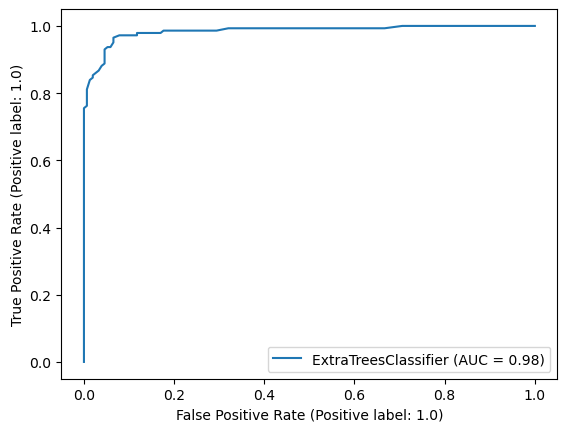

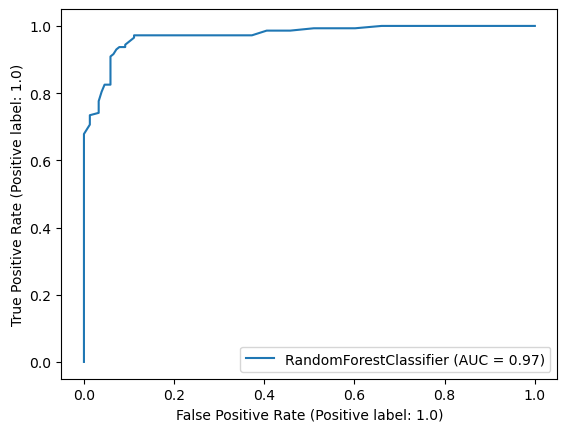

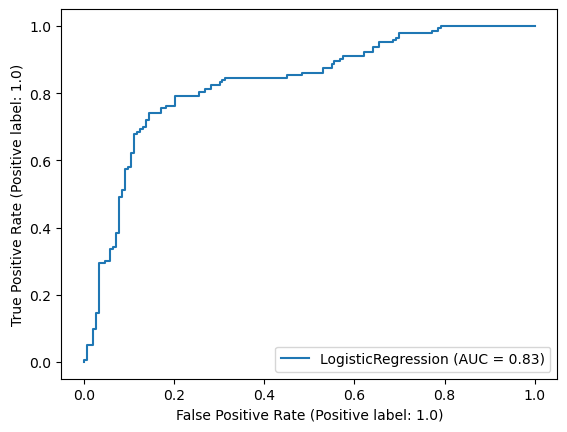

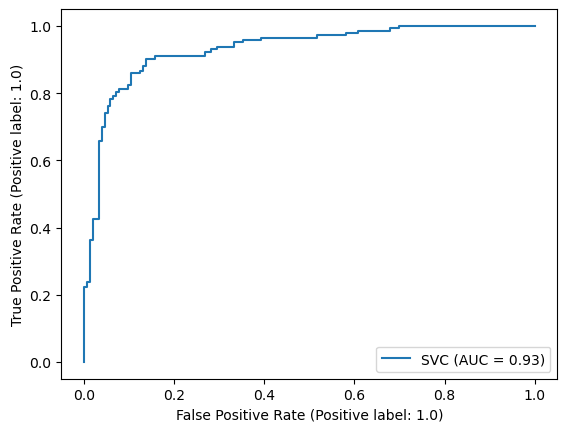

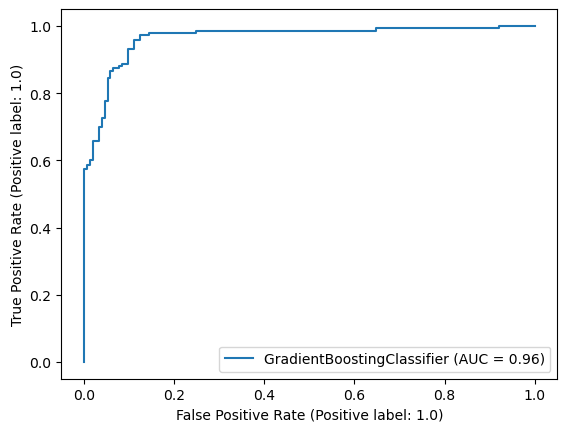

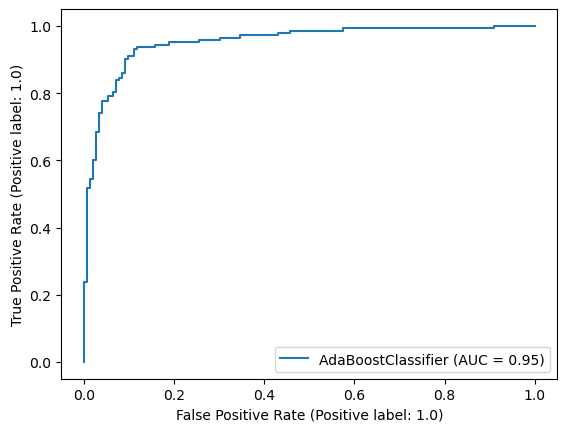

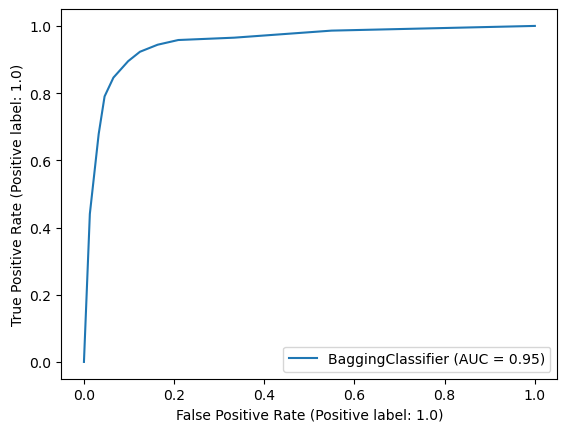

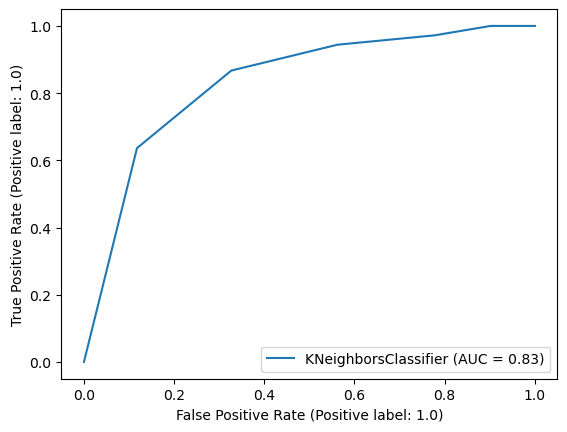

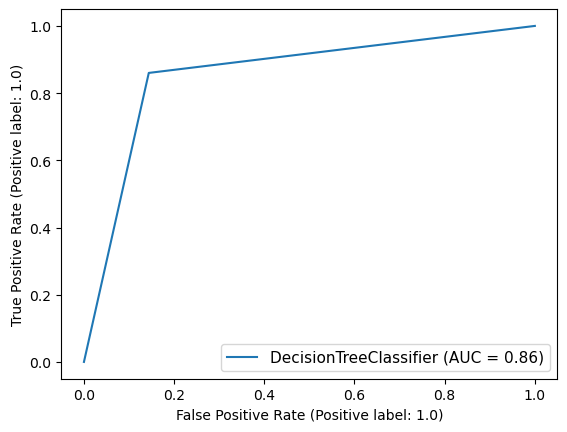

In [98]:
display= RocCurveDisplay.from_estimator(ET,x_test,y_test) #ax =Axes with confusion Matrix
RocCurveDisplay.from_estimator(RFC,x_test,y_test)
RocCurveDisplay.from_estimator(LR,x_test,y_test)
RocCurveDisplay.from_estimator(svc,x_test,y_test)
RocCurveDisplay.from_estimator(GB,x_test,y_test)
RocCurveDisplay.from_estimator(ABC,x_test,y_test)
RocCurveDisplay.from_estimator(BC,x_test,y_test)
RocCurveDisplay.from_estimator(knn,x_test,y_test)
RocCurveDisplay.from_estimator(DTC,x_test,y_test)

plt.legend(prop={'size':11},loc='lower right')
plt.show()

## Plotting ROC and comparing AUC for the Best Model

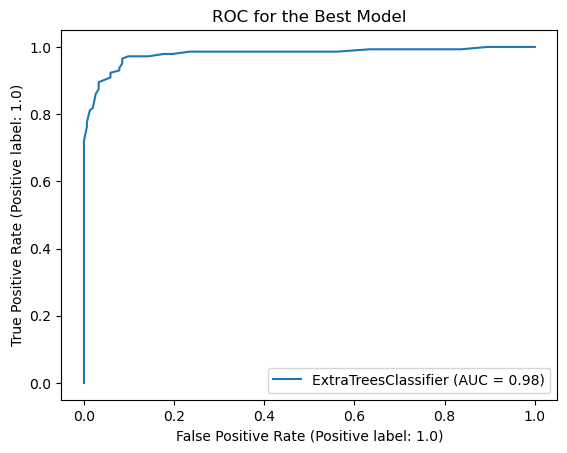

In [99]:
#Lets check the AUC for the best model after hyper parameter tuning
RocCurveDisplay.from_estimator(Final_model,x_test,y_test)
plt.title("ROC for the Best Model")
plt.show()

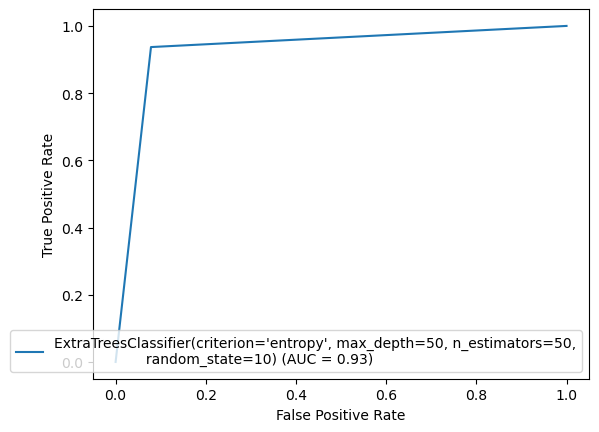

In [100]:
from sklearn import metrics
fpr,tpr,thesholds=metrics.roc_curve(y_test,pred)
roc_auc=metrics.auc(fpr,tpr)
display=metrics.RocCurveDisplay(fpr=fpr,tpr=tpr,roc_auc=roc_auc,estimator_name=Final_model)
display.plot()

#### Here we have plotted the ROC curve for the final model and the AUC value for our best model is 93%

# Saving Model

In [101]:
import joblib
joblib.dump(Final_model,"Insurance_Claim_Fraud_Prediction.pkl")

['Insurance_Claim_Fraud_Prediction.pkl']

### Predicting using the saved model

In [102]:
#lets load the saved model and get the predictions
model=joblib.load('Insurance_Claim_Fraud_Prediction.pkl')

#Prediction
prediction=model.predict(x_test)
prediction

array([0., 1., 1., 1., 0., 1., 0., 0., 1., 0., 1., 0., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 0., 0., 0., 0., 1., 1., 0., 1., 0., 1., 0., 1., 1.,
       0., 0., 1., 0., 1., 1., 1., 1., 1., 0., 1., 1., 0., 0., 1., 0., 0.,
       0., 0., 0., 0., 0., 1., 0., 1., 1., 0., 0., 0., 0., 0., 1., 0., 0.,
       1., 1., 0., 0., 1., 1., 0., 1., 1., 1., 1., 0., 0., 1., 1., 1., 0.,
       0., 0., 0., 1., 0., 1., 1., 1., 1., 1., 0., 1., 0., 0., 0., 1., 1.,
       0., 1., 1., 0., 1., 0., 1., 1., 0., 1., 0., 1., 1., 0., 0., 1., 1.,
       0., 0., 0., 0., 0., 1., 1., 0., 0., 1., 0., 0., 1., 0., 0., 1., 1.,
       0., 0., 1., 0., 0., 0., 0., 0., 1., 1., 1., 1., 0., 0., 0., 1., 0.,
       0., 1., 0., 1., 1., 0., 0., 0., 0., 1., 0., 0., 1., 1., 0., 0., 0.,
       0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 1., 0., 1., 0., 1., 0., 1.,
       1., 1., 1., 0., 0., 1., 0., 1., 0., 1., 1., 1., 0., 0., 0., 0., 0.,
       0., 1., 1., 1., 0., 0., 1., 1., 1., 0., 1., 0., 1., 0., 0., 0., 1.,
       0., 1., 1., 1., 1.

#### These are predicted values of Fraud  and Non-Fraud cases. 

# Point to Remember : Fraud = 1, Non-Fraud = 0

In [103]:
a=np.array(y_test)
df=pd.DataFrame()
df["Predicted"]=prediction
df["Original"]=a
df

,Predicted,Original
0,0.0,0.0
1,1.0,1.0
2,1.0,1.0
3,1.0,1.0
4,0.0,0.0
...,...,...
291,1.0,1.0
292,0.0,0.0
293,1.0,0.0
294,0.0,0.0


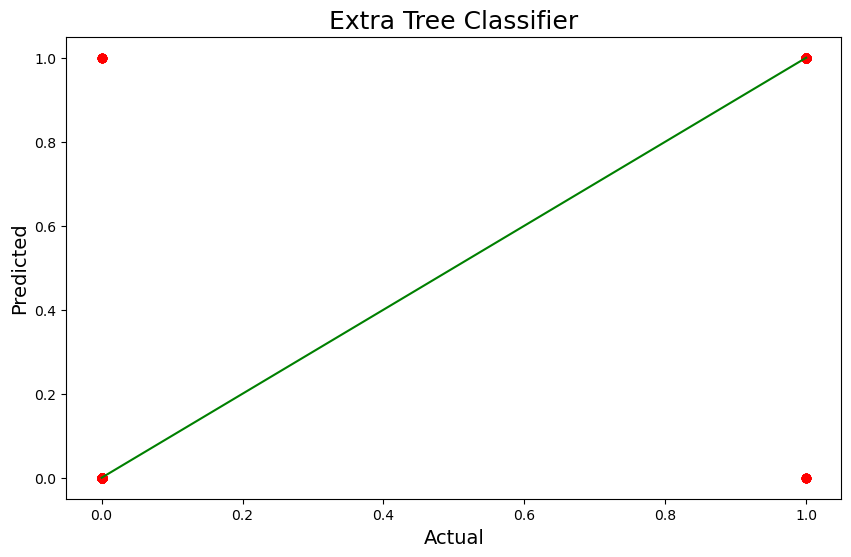

In [104]:
## Ploting a chart to see thee predicted values
plt.figure(figsize=(10,6))
plt.scatter(x=predET,y=y_test,color='r')
plt.plot(predET,predET,color='g')
plt.xlabel('Actual',fontsize=14)
plt.ylabel('Predicted', fontsize=14)
plt.title('Extra Tree Classifier', fontsize=18)
plt.show()

# The End 